In [1]:
import tensorflow as tf
import pandas as pd

from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler,LabelEncoder, Binarizer,label_binarize
import json
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from collections import Counter
from sklearn.metrics import precision_recall_curve, average_precision_score,roc_curve, auc,confusion_matrix,classification_report,accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,ConfusionMatrixDisplay
from imblearn.over_sampling import ADASYN
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier,StackingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier, ExtraTreesClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
import shap
import lime
from scipy.stats import pearsonr

import lime.lime_tabular
from sklearn.feature_selection import SelectKBest, chi2,f_classif

d:\Projects\Python\ML\cervical\venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


load data

In [2]:
df =pd.read_csv("../../cervical-cancer_csv.csv")

**Data information,preparation**

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 835 entries, 0 to 834
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 835 non-null    int64  
 1   Number of sexual partners           810 non-null    float64
 2   First sexual intercourse            828 non-null    float64
 3   Num of pregnancies                  779 non-null    float64
 4   Smokes                              822 non-null    float64
 5   Smokes (years)                      822 non-null    float64
 6   Smokes (packs/year)                 822 non-null    float64
 7   Hormonal Contraceptives             732 non-null    float64
 8   Hormonal Contraceptives (years)     732 non-null    float64
 9   IUD                                 723 non-null    float64
 10  IUD (years)                         723 non-null    float64
 11  STDs                                735 non-n

In [4]:
df.describe()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
count,835.000000,810.000000,828.000000,779.000000,822.000000,822.000000,822.000000,732.000000,732.000000,723.000000,...,71.000000,71.000000,835.000000,835.000000,835.000000,835.000000,835.000000,835.000000,835.000000,835.000000
mean,27.023952,2.551852,17.020531,2.304236,0.149635,1.253850,0.465823,0.651639,2.302916,0.114799,...,6.140845,5.816901,0.021557,0.010778,0.021557,0.028743,0.041916,0.087425,0.051497,0.064671
std,8.482986,1.676686,2.817000,1.455817,0.356930,4.140727,2.256273,0.476777,3.794180,0.319000,...,5.895024,5.755271,0.145319,0.103320,0.145319,0.167182,0.200518,0.282626,0.221142,0.246091
min,13.000000,1.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.000000,2.000000,15.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,26.000000,2.000000,17.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.500000,0.000000,...,4.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,32.000000,3.000000,18.000000,3.000000,0.000000,0.000000,0.000000,1.000000,3.000000,0.000000,...,8.000000,7.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,84.000000,28.000000,32.000000,11.000000,1.000000,37.000000,37.000000,1.000000,30.000000,1.000000,...,22.000000,22.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
df.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
2,34,1.0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,NaN,NaN,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0


In [6]:
df.tail()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
830,34,3.0,18.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
831,32,2.0,19.0,1.0,0.0,0.0,0.0,1.0,8.00,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
832,25,2.0,17.0,0.0,0.0,0.0,0.0,1.0,0.08,0.0,...,NaN,NaN,0,0,0,0,0,0,1,0
833,33,2.0,24.0,2.0,0.0,0.0,0.0,1.0,0.08,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
834,29,2.0,20.0,1.0,0.0,0.0,0.0,1.0,0.50,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0


In [7]:
shape=df.shape
print(f"Shape: {shape}")

Shape: (835, 36)


In [8]:
columns=df.columns
print(f"columns: {columns}")

columns: Index(['Age', 'Number of sexual partners', 'First sexual intercourse',
       'Num of pregnancies', 'Smokes', 'Smokes (years)', 'Smokes (packs/year)',
       'Hormonal Contraceptives', 'Hormonal Contraceptives (years)', 'IUD',
       'IUD (years)', 'STDs', 'STDs (number)', 'STDs:condylomatosis',
       'STDs:cervical condylomatosis', 'STDs:vaginal condylomatosis',
       'STDs:vulvo-perineal condylomatosis', 'STDs:syphilis',
       'STDs:pelvic inflammatory disease', 'STDs:genital herpes',
       'STDs:molluscum contagiosum', 'STDs:AIDS', 'STDs:HIV',
       'STDs:Hepatitis B', 'STDs:HPV', 'STDs: Number of diagnosis',
       'STDs: Time since first diagnosis', 'STDs: Time since last diagnosis',
       'Dx:Cancer', 'Dx:CIN', 'Dx:HPV', 'Dx', 'Hinselmann', 'Schiller',
       'Citology', 'Biopsy'],
      dtype='object')


In [9]:
datatypes=df.dtypes
print(datatypes)

Age                                     int64
Number of sexual partners             float64
First sexual intercourse              float64
Num of pregnancies                    float64
Smokes                                float64
Smokes (years)                        float64
Smokes (packs/year)                   float64
Hormonal Contraceptives               float64
Hormonal Contraceptives (years)       float64
IUD                                   float64
IUD (years)                           float64
STDs                                  float64
STDs (number)                         float64
STDs:condylomatosis                   float64
STDs:cervical condylomatosis          float64
STDs:vaginal condylomatosis           float64
STDs:vulvo-perineal condylomatosis    float64
STDs:syphilis                         float64
STDs:pelvic inflammatory disease      float64
STDs:genital herpes                   float64
STDs:molluscum contagiosum            float64
STDs:AIDS                         

In [10]:
duplicates=df.duplicated()
print(duplicates)


0      False
1      False
2      False
3      False
4      False
       ...  
830    False
831    False
832    False
833    False
834    False
Length: 835, dtype: bool


In [11]:
missing_values=df.isnull().sum()
print(f"Missing entries: {missing_values}")

Missing entries: Age                                     0
Number of sexual partners              25
First sexual intercourse                7
Num of pregnancies                     56
Smokes                                 13
Smokes (years)                         13
Smokes (packs/year)                    13
Hormonal Contraceptives               103
Hormonal Contraceptives (years)       103
IUD                                   112
IUD (years)                           112
STDs                                  100
STDs (number)                         100
STDs:condylomatosis                   100
STDs:cervical condylomatosis          100
STDs:vaginal condylomatosis           100
STDs:vulvo-perineal condylomatosis    100
STDs:syphilis                         100
STDs:pelvic inflammatory disease      100
STDs:genital herpes                   100
STDs:molluscum contagiosum            100
STDs:AIDS                             100
STDs:HIV                              100
STDs:Hepatitis B 

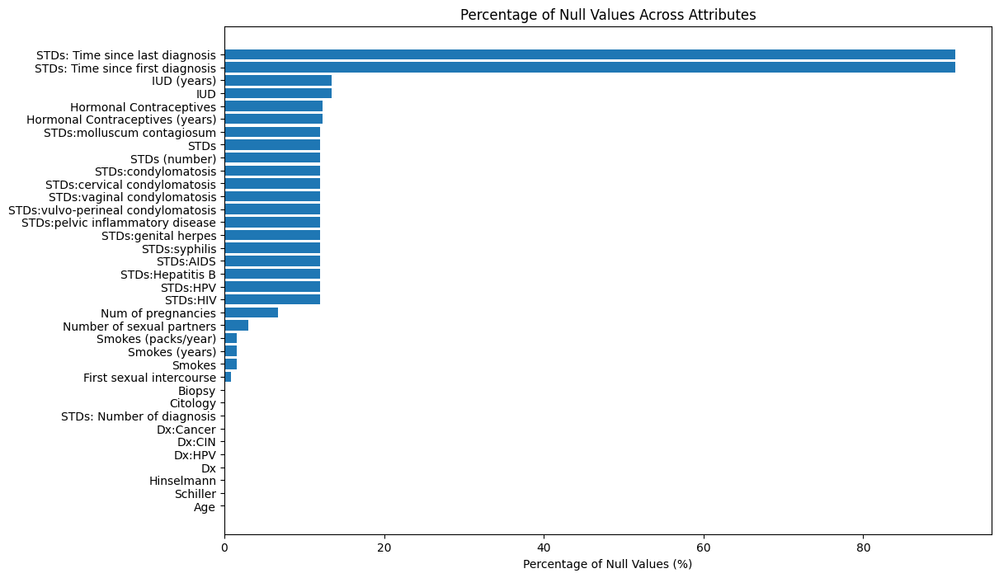

In [12]:
null_percentage = df.isnull().mean() * 100

# Sort the values in ascending order
sorted_idx = np.argsort(null_percentage)

# Plotting
plt.figure(figsize=(12, 8))
plt.barh(range(len(sorted_idx)), null_percentage.iloc[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), df.columns[sorted_idx])
plt.xlabel("Percentage of Null Values (%)")
plt.title("Percentage of Null Values Across Attributes")
plt.show()

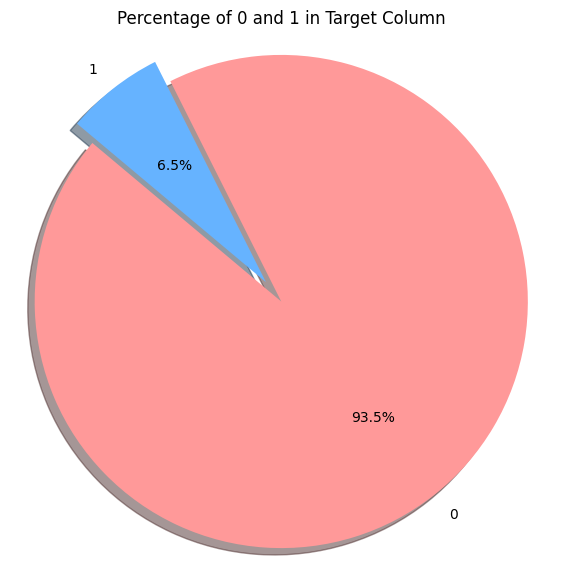

In [13]:
target_counts = df['Biopsy'].value_counts()

# Calculate the percentages for each value
labels = ['0', '1']
sizes = target_counts.values
colors = ['#ff9999','#66b3ff']
explode = (0.1, 0)  # explode the first slice

# Create the pie chart
plt.figure(figsize=(7, 7))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Percentage of 0 and 1 in Target Column')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the plot
plt.show()

Feature Selection

In [14]:
X = df.drop('Biopsy', axis=1)
y = df['Biopsy']

([<matplotlib.axis.XTick at 0x24a1e6b2d00>,
 [Text(0, 0, '0'), Text(1, 0, '1')])

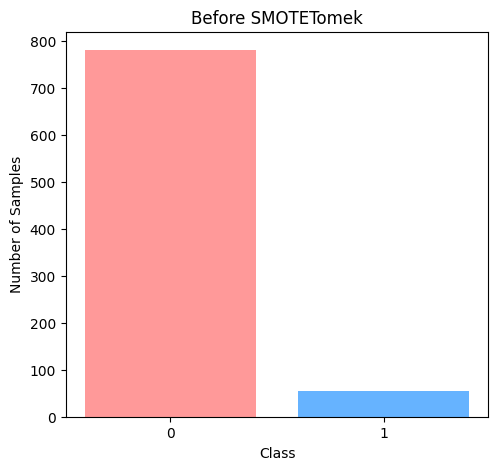

In [16]:
# Visualize the target distribution before resampling
counter_before = Counter(y)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.bar(counter_before.keys(), counter_before.values(), color=['#ff9999','#66b3ff'])
plt.title('Before SMOTETomek')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks([0, 1])

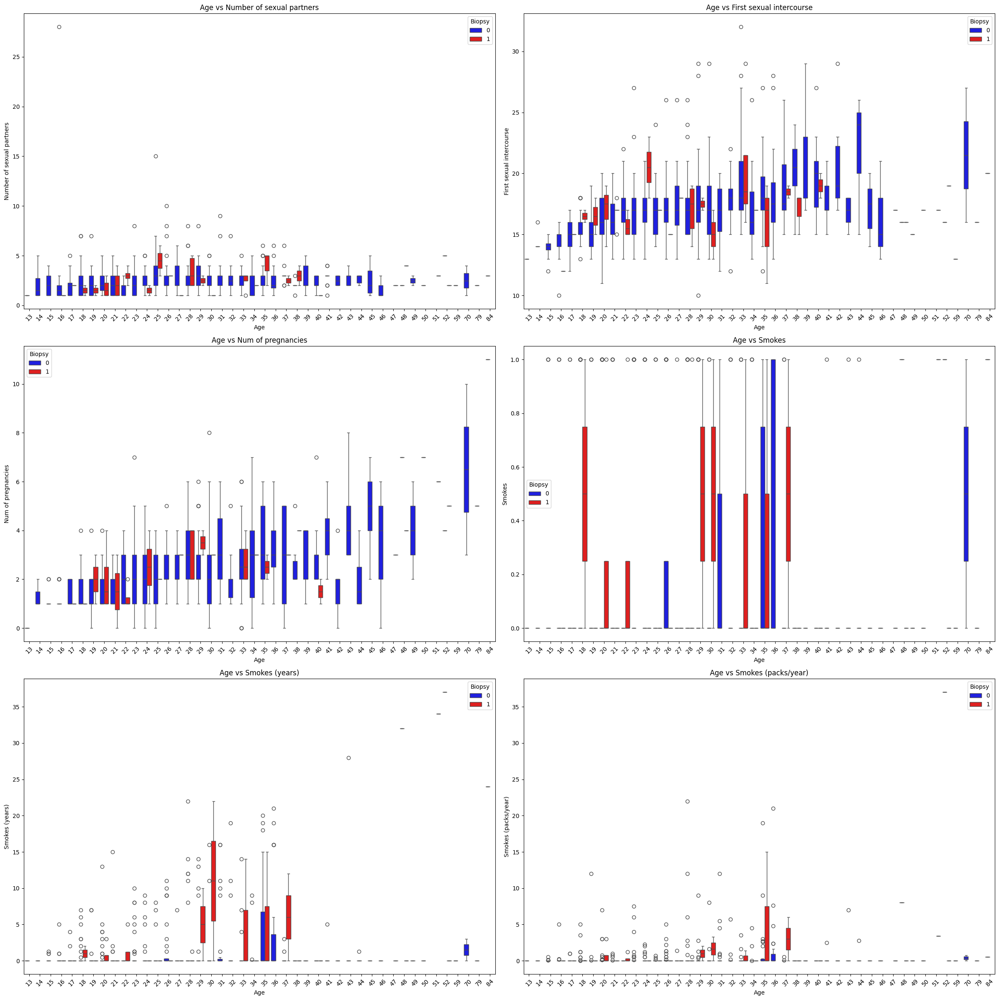

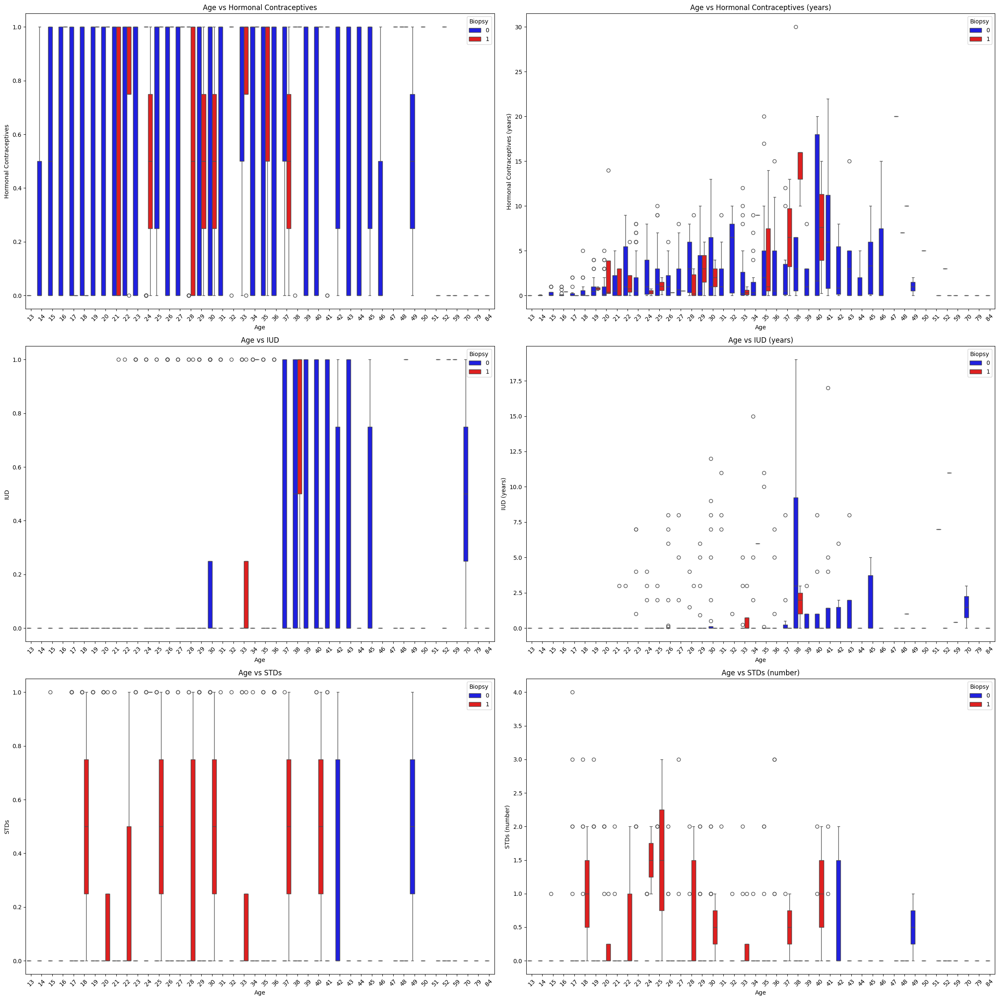

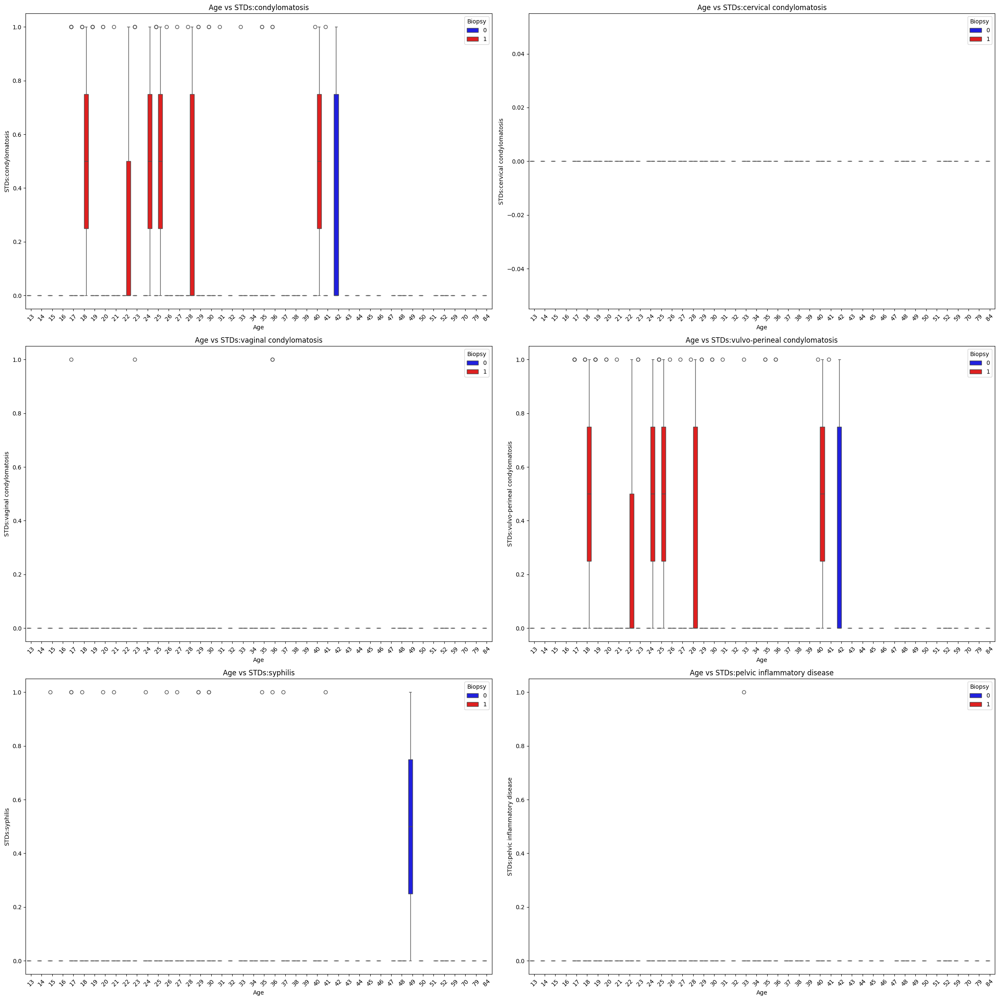

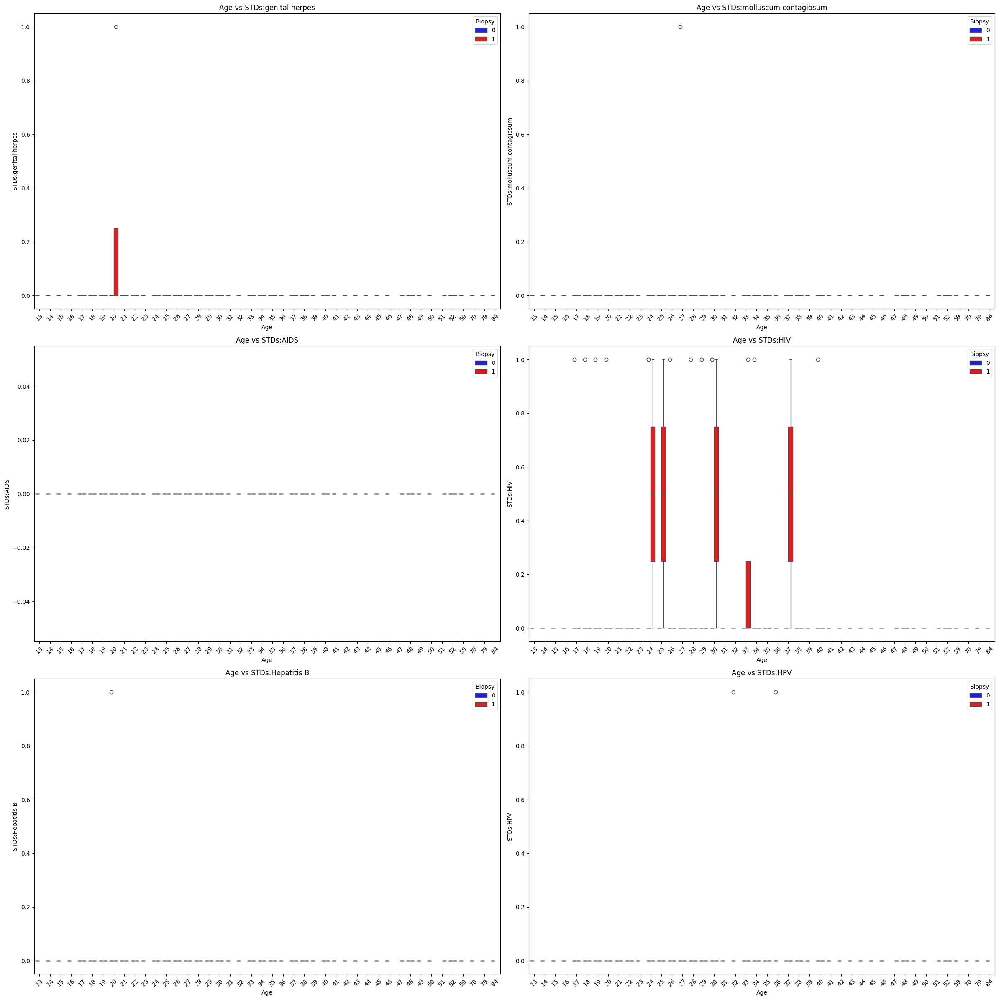

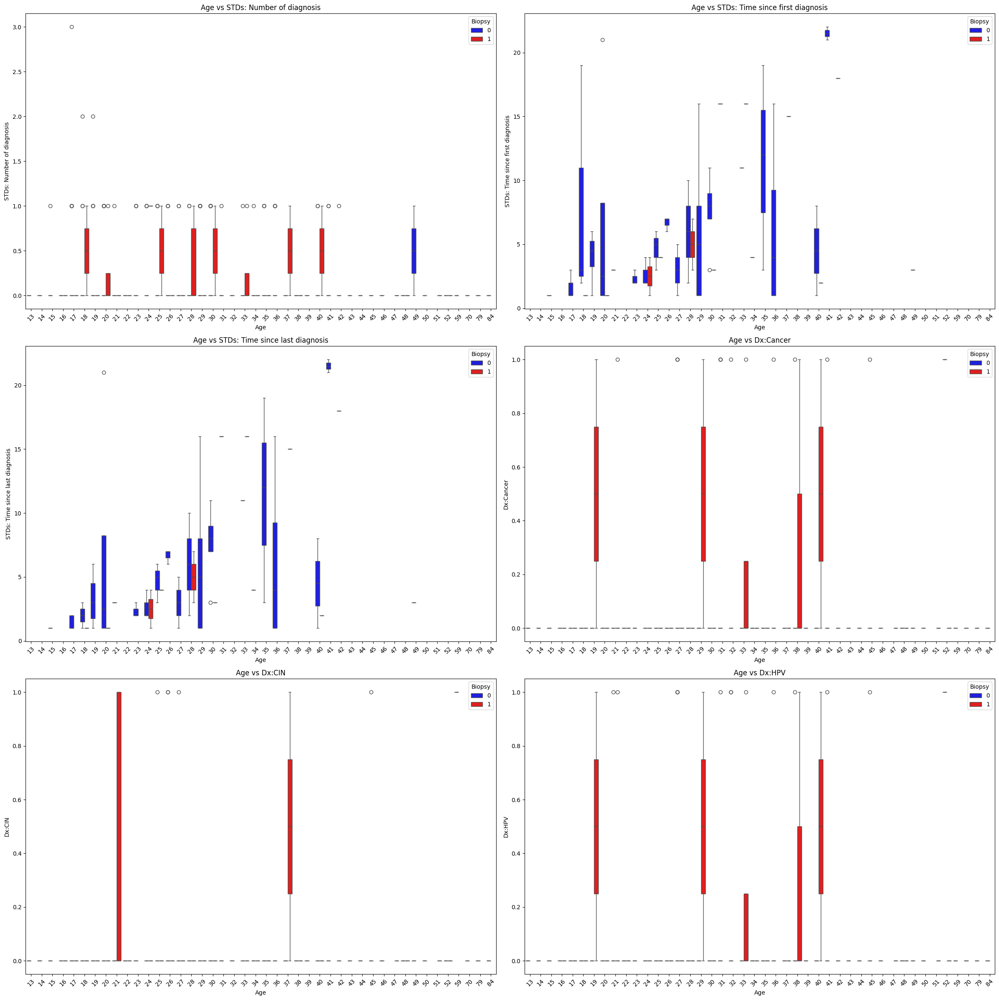

...

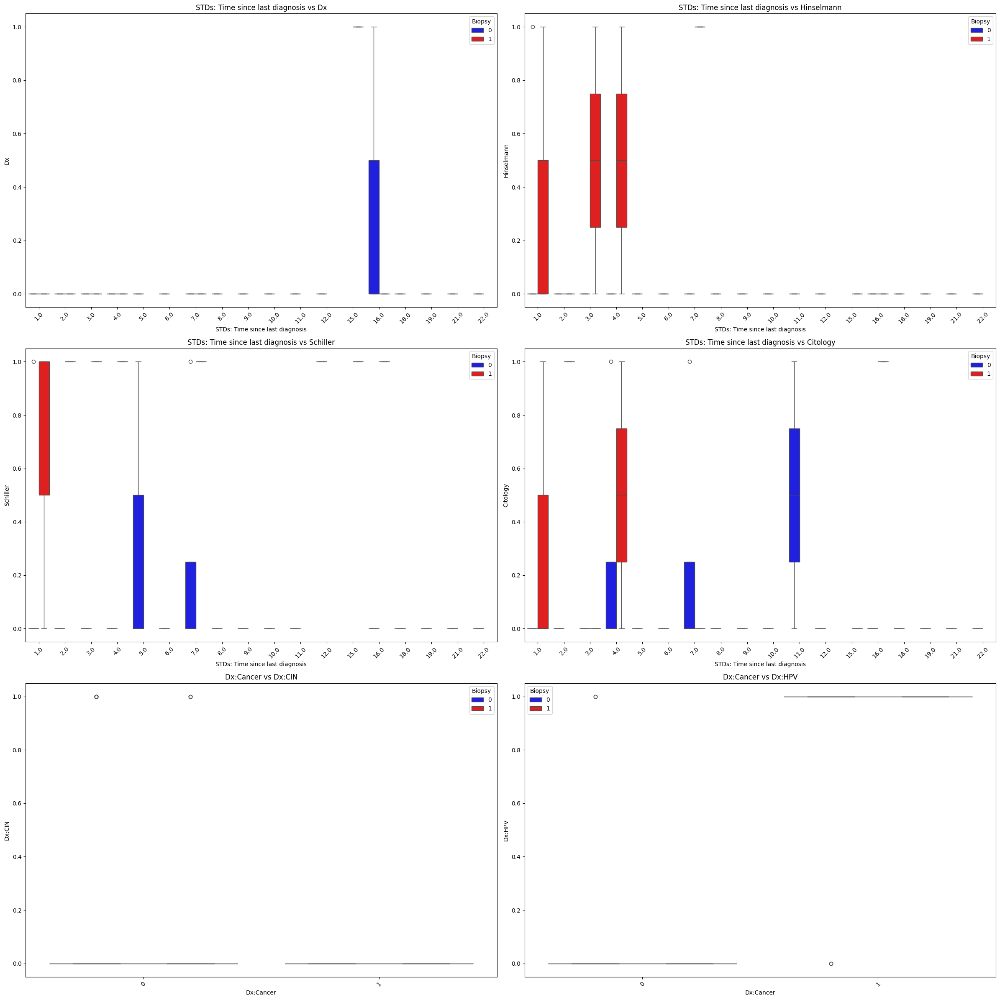

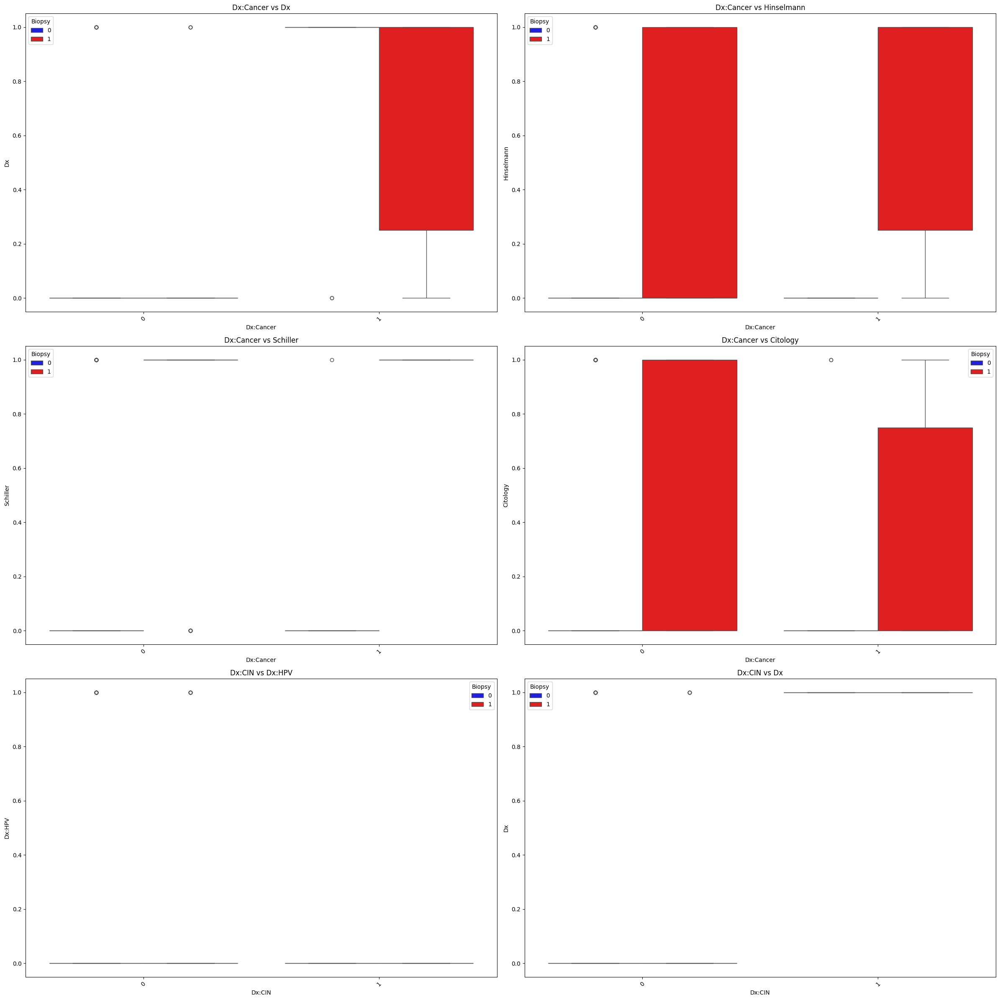

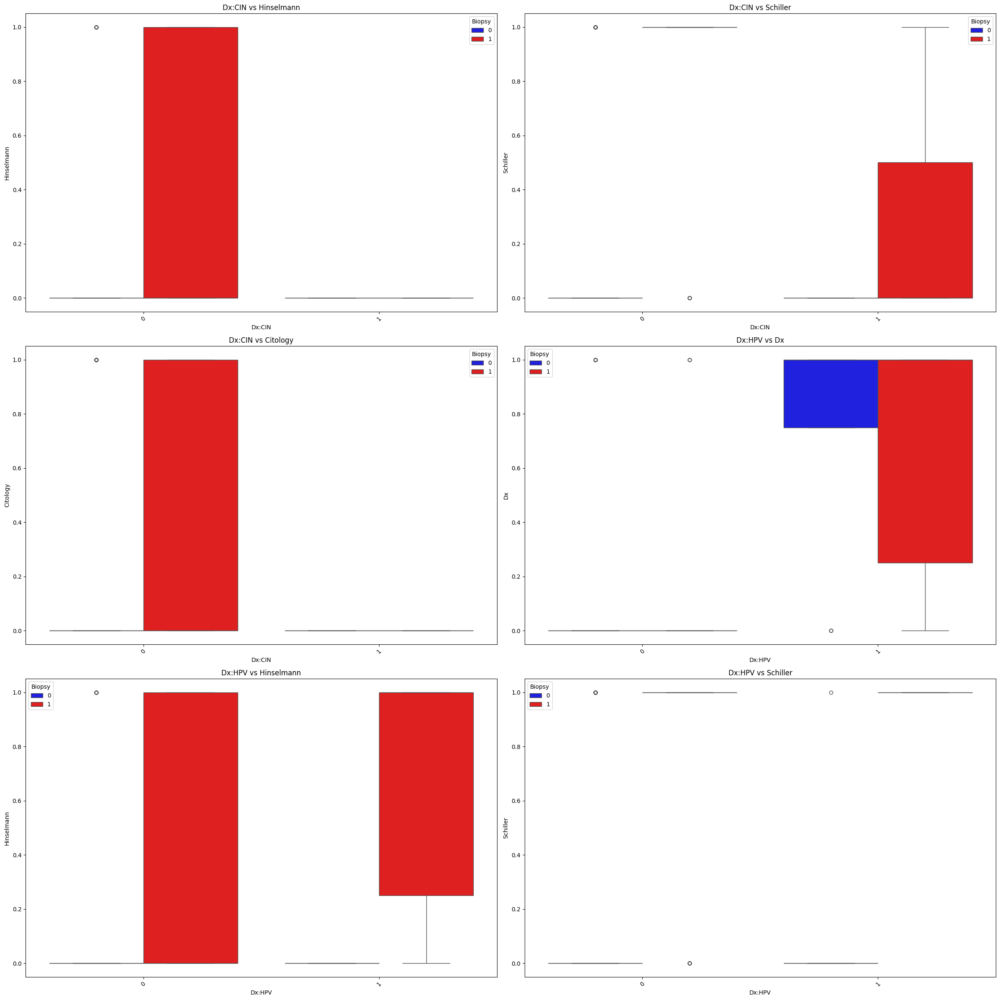

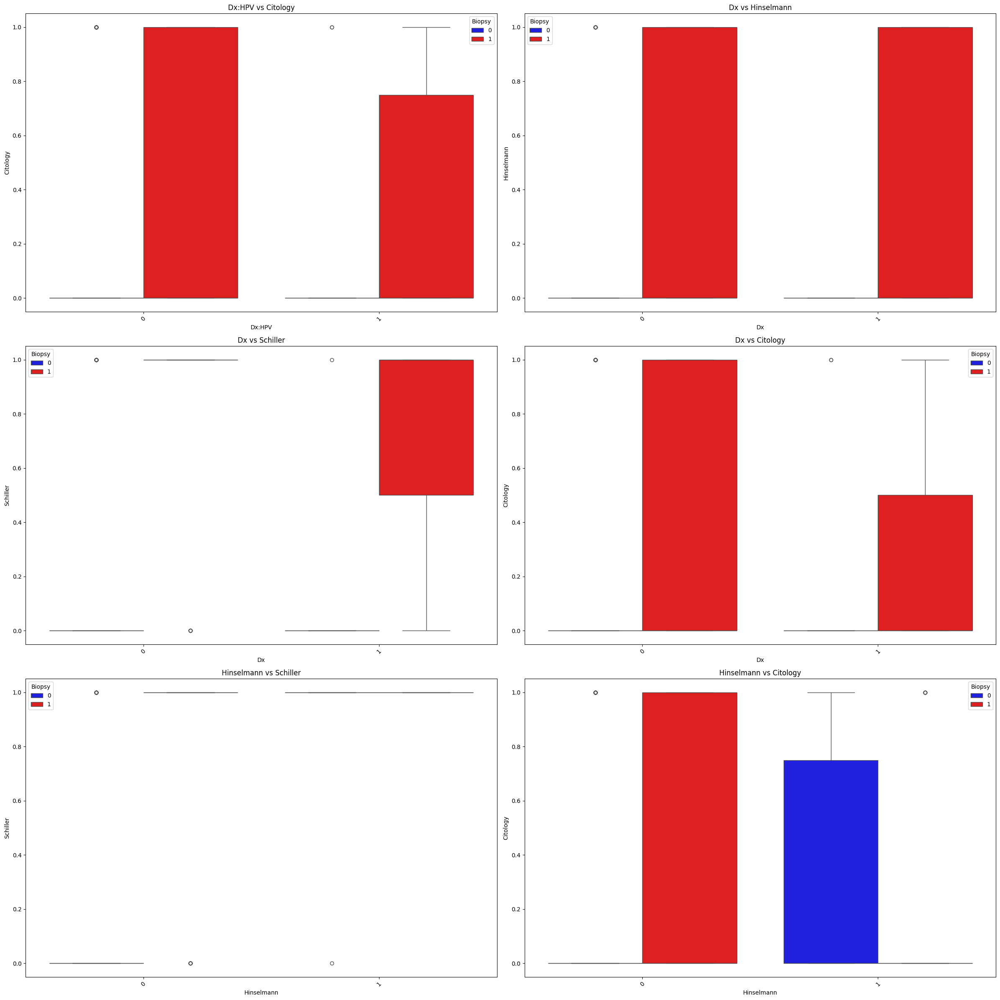

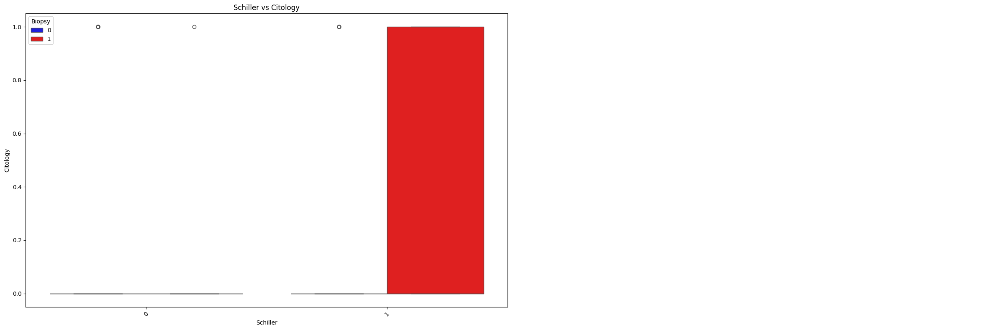

In [17]:
target_col = 'Biopsy'

# Create a list of features (excluding the target column)
features = [col for col in df.columns if col != target_col]

# Number of feature pairs to plot at once
batch_size = 6

# Function to plot a batch of feature pairs
def plot_feature_pairs(features, df, target_col, batch_size, batch_index):
    start = batch_size * batch_index
    end = start + batch_size
    feature_pairs = [(features[i], features[j]) for i in range(len(features)) for j in range(i + 1, len(features))][start:end]

    num_pairs = len(feature_pairs)
    num_cols = 2  # Number of columns in the grid
    num_rows = (num_pairs + num_cols - 1) // num_cols  # Calculate number of rows needed

    # Adjust figure size to be more manageable
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 12, num_rows * 8))

    # Flatten the axes array for easy indexing
    axes = axes.flatten()

    # Plot each feature pair against the target column
    for i, (x_feature, y_feature) in enumerate(feature_pairs):
        sns.boxplot(x=x_feature, y=y_feature, hue=target_col, data=df, palette={0: 'blue', 1: 'red'}, ax=axes[i])
        axes[i].set_title(f'{x_feature} vs {y_feature}')
        axes[i].set_xlabel(x_feature)
        axes[i].set_ylabel(y_feature)
        axes[i].tick_params(axis='x', rotation=45, labelsize=10)  # Rotate x-axis labels

    # Turn off any unused subplots
    for j in range(num_pairs, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Plot feature pairs in batches
num_batches = (len(features) * (len(features) - 1) // 2 + batch_size - 1) // batch_size
for batch_index in range(num_batches):
    plot_feature_pairs(features, df, target_col, batch_size, batch_index)

DATA CLEANING

 Remove Rows with Missing Target Values

In [18]:

df=df.dropna(subset=["Biopsy"])
df.shape

(835, 36)

 Impute Missing Values for Features

In [19]:
X = df.drop('Biopsy', axis=1,inplace=False)
y = df['Biopsy']

numeric_cols = X.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = X.select_dtypes(include=['object', 'bool']).columns

numeric_transformer = SimpleImputer(strategy='mean')
categorical_transformer = SimpleImputer(strategy='most_frequent')

# Create the ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Fit and transform the data
df = pd.DataFrame(preprocessor.fit_transform(X), columns=X.columns)
df=pd.concat([df, y.reset_index(drop=True)], axis=1)



In [20]:
# Remove duplicate rows
df = df.drop_duplicates()
df.drop(['STDs: Time since first diagnosis', 'STDs: Time since last diagnosis'], axis=1, inplace=True)
categorical_cols = df.select_dtypes(include=['object', 'bool']).columns

X = df.drop('Biopsy', axis=1,inplace=False)
y = df['Biopsy']

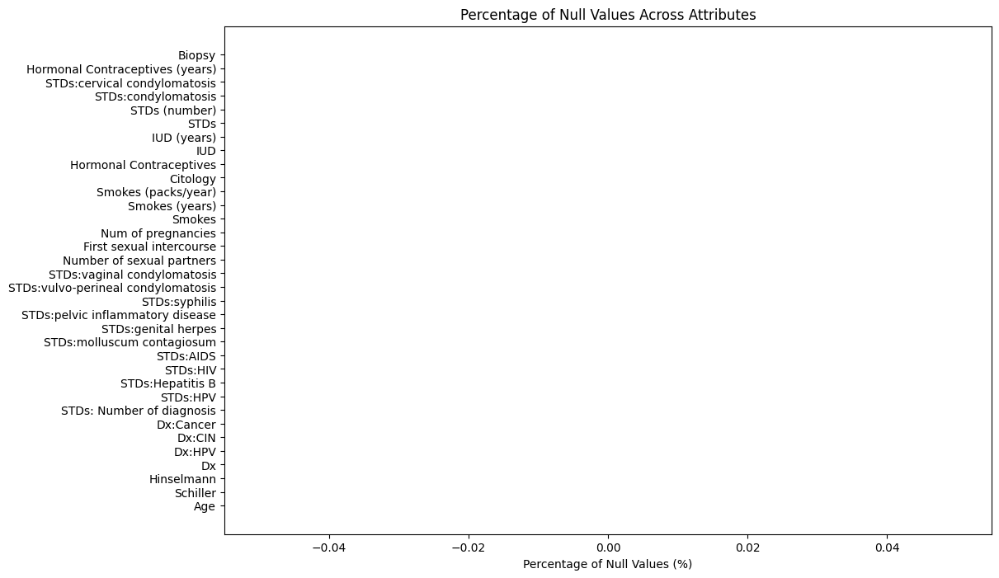

In [21]:
null_percentage = df.isnull().mean() * 100

# Sort the values in ascending order
sorted_idx = np.argsort(null_percentage)

# Plotting
plt.figure(figsize=(12, 8))
plt.barh(range(len(sorted_idx)), null_percentage.iloc[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), df.columns[sorted_idx])
plt.xlabel("Percentage of Null Values (%)")
plt.title("Percentage of Null Values Across Attributes")
plt.show()

In [22]:
from imblearn.combine import SMOTETomek
smote_tomek = SMOTETomek(random_state=42)
X, y  = smote_tomek.fit_resample(X, y)

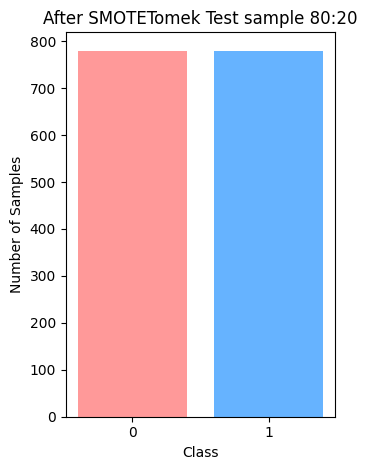

In [24]:
counter_after = Counter(y)
plt.subplot(1, 2, 2)
plt.bar(counter_after.keys(), counter_after.values(), color=['#ff9999','#66b3ff'])
plt.title('After SMOTETomek Test sample 80:20')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks([0, 1])

plt.tight_layout()
plt.show()

To identify the columns with the highest chi-square values, we can use the Chi-Square Test of Independence. This statistical test is used to determine if there is a significant association between two categorical variables. It helps in feature selection by identifying variables that have a strong association with the target variable

In [25]:

y_encoded = LabelEncoder().fit_transform(y)  # Encode the target variable if not binary

# Select categorical or binned features for chi-square test
# For simplicity, assuming all features are categorical or have been binned appropriately

# Convert any numerical columns to categorical if necessary (example for 'Age')
# df['Age'] = pd.cut(df['Age'], bins=[10, 20, 30, 40, 50, 60, 70, 80], labels=False)

# If required, use LabelEncoder to encode categorical variables
X_encoded = X.apply(LabelEncoder().fit_transform)

# Apply SelectKBest with chi2 to find top features
chi2_selector = SelectKBest(chi2, k='all')
chi2_selector.fit(X_encoded, y_encoded)
chi2_scores = pd.DataFrame({
    'Feature': X.columns,
    'Chi2 Score': chi2_selector.scores_
})

# Sort by Chi2 Score
chi2_scores = chi2_scores.sort_values(by='Chi2 Score', ascending=False)

# Display the top features
print(chi2_scores)

                               Feature     Chi2 Score
30                          Hinselmann  117799.929178
31                            Schiller  101711.930233
32                            Citology   78665.277966
29                                  Dx   10841.392996
28                              Dx:HPV    8536.970732
26                           Dx:Cancer    8536.970732
3                   Num of pregnancies    6671.814187
12                       STDs (number)    5790.411152
11                                STDs    5354.831286
25           STDs: Number of diagnosis    4773.174767
27                              Dx:CIN    3224.477876
17                       STDs:syphilis    2876.364787
15         STDs:vaginal condylomatosis    2238.651113
24                            STDs:HPV    2149.945109
20          STDs:molluscum contagiosum    2105.847226
23                    STDs:Hepatitis B    2105.847226
18    STDs:pelvic inflammatory disease    2105.847226
22                          

Plotting for Cancer Diagnosis

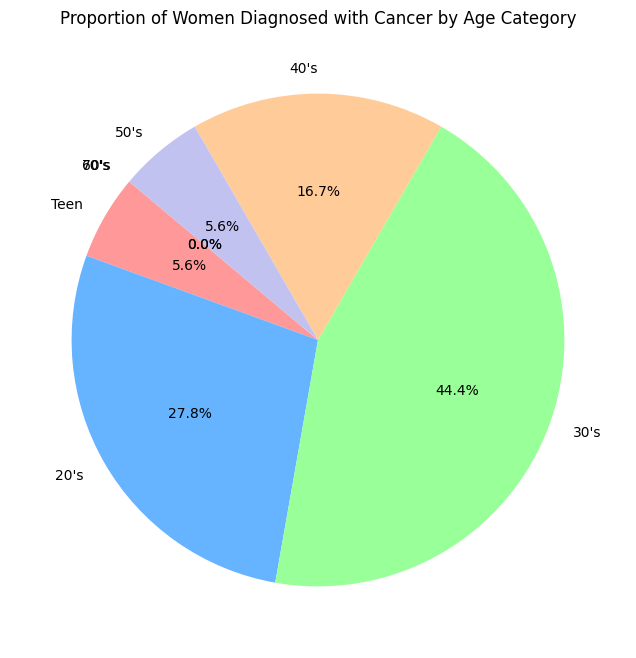

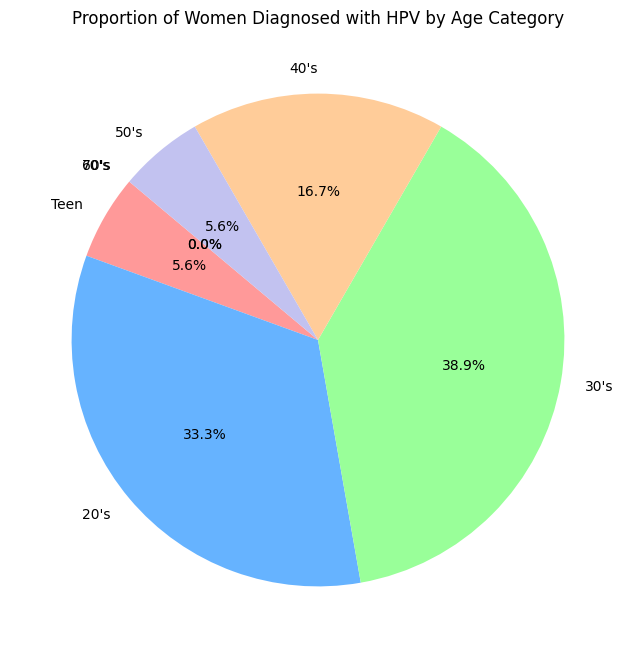

In [26]:
bins = [0, 19, 29, 39, 49, 59, 69, 79]
labels = ['Teen', '20\'s', '30\'s', '40\'s', '50\'s', '60\'s', '70\'s']
df_cpoy=df.copy()
# Categorize the 'Age' column
df_cpoy['Age Category'] = pd.cut(df_cpoy['Age'], bins=bins, labels=labels, right=True)

# Plot the pie chart
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0','#ffb3e6','#c2f0c2']

#cancer

cancer_df = df_cpoy[df_cpoy['Dx:Cancer'] == 1]

# Count the number of cancer diagnoses in each age category
cancer_counts = cancer_df['Age Category'].value_counts().sort_index()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0','#ffb3e6','#c2f0c2']
# Plot the pie chart for cancer diagnosis
plt.figure(figsize=(8, 8))
plt.pie(cancer_counts, labels=cancer_counts.index, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Proportion of Women Diagnosed with Cancer by Age Category')
plt.show()


# Filter the dataset for HPV diagnosis
hpv_df = df_cpoy[df_cpoy['Dx:HPV'] == 1]

# Count the number of HPV diagnoses in each age category
hpv_counts = hpv_df['Age Category'].value_counts().sort_index()

# Plot the pie chart for HPV diagnosis
plt.figure(figsize=(8, 8))
plt.pie(hpv_counts, labels=hpv_counts.index, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Proportion of Women Diagnosed with HPV by Age Category')
plt.show()


Categorical and continuous columns selection

In [27]:

# Function to identify if a column is categorical
def is_categorical(col, threshold=10):
    unique_values = len(col.unique())
    if unique_values <= threshold:
        return True
    return False

# Identify categorical and continuous columns
categorical_cols = []
continuous_cols = []

for col in X.columns:
    if is_categorical(X[col]):
        categorical_cols.append(col)
    else:
        continuous_cols.append(col)

# Check dtype for additional information
for col in X.columns:
    if X[col].dtype == 'object' or X[col].dtype == 'bool':
        if col not in categorical_cols:
            categorical_cols.append(col)
    elif X[col].dtype in ['int64', 'float64']:
        if col not in continuous_cols and col not in categorical_cols:
            continuous_cols.append(col)

print(f"Categorical Columns: {categorical_cols}")
print(f"Continuous Columns: {continuous_cols}")


Categorical Columns: ['STDs:cervical condylomatosis', 'STDs:AIDS']
Continuous Columns: ['Age', 'Number of sexual partners', 'First sexual intercourse', 'Num of pregnancies', 'Smokes', 'Smokes (years)', 'Smokes (packs/year)', 'Hormonal Contraceptives', 'Hormonal Contraceptives (years)', 'IUD', 'IUD (years)', 'STDs', 'STDs (number)', 'STDs:condylomatosis', 'STDs:vaginal condylomatosis', 'STDs:vulvo-perineal condylomatosis', 'STDs:syphilis', 'STDs:pelvic inflammatory disease', 'STDs:genital herpes', 'STDs:molluscum contagiosum', 'STDs:HIV', 'STDs:Hepatitis B', 'STDs:HPV', 'STDs: Number of diagnosis', 'Dx:Cancer', 'Dx:CIN', 'Dx:HPV', 'Dx', 'Hinselmann', 'Schiller', 'Citology']


C:\Users\BoraTech\AppData\Local\Temp\ipykernel_7932\3579970622.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Chi2 Score', y='Feature', data=chi2_df, palette='viridis')


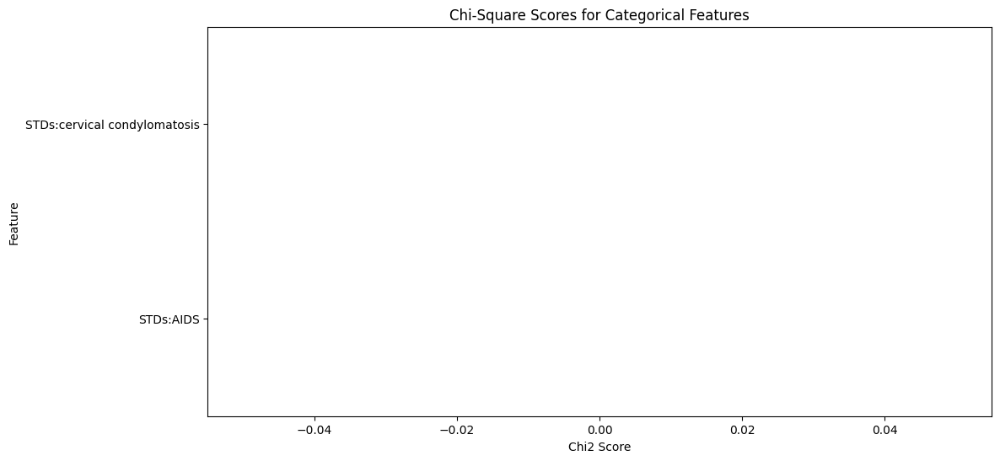

C:\Users\BoraTech\AppData\Local\Temp\ipykernel_7932\3579970622.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='F-Score', y='Feature', data=f_df, palette='viridis')


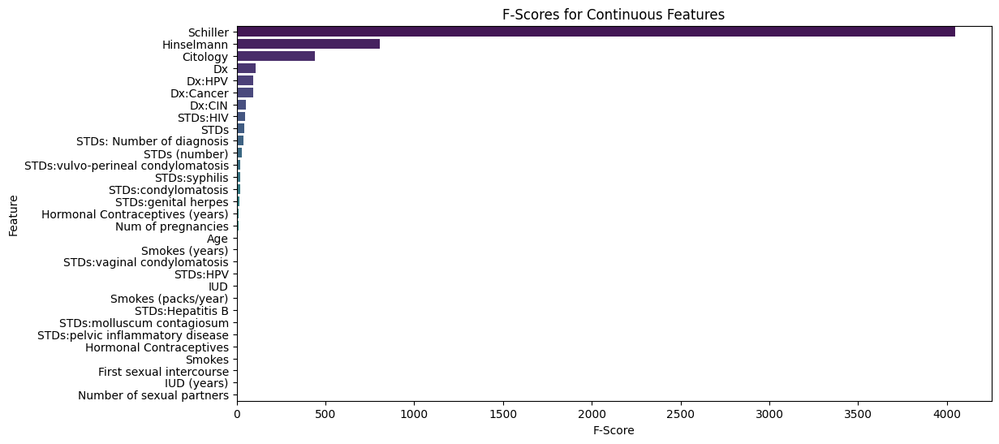

Loadings:
                                         PC1       PC2       PC3       PC4  \
STDs:HIV                            0.211037  0.097576  0.150196  0.438397   
STDs:condylomatosis                 0.399286 -0.003870 -0.086433 -0.258101   
Citology                            0.042796  0.271267  0.037426 -0.201000   
Num of pregnancies                 -0.053682  0.167712  0.402262  0.177119   
Dx                                 -0.043526  0.359104 -0.411807  0.308946   
STDs:syphilis                       0.085816 -0.042953  0.049083  0.186671   
STDs                                0.435875  0.029160  0.008238  0.138169   
Schiller                            0.105692  0.380547  0.164998 -0.184036   
Hinselmann                          0.050679  0.273006  0.123423 -0.186605   
STDs:genital herpes                 0.074820 -0.050328 -0.108238  0.055618   
Dx:Cancer                          -0.077703  0.476130 -0.195697 -0.082743   
Dx:HPV                             -0.077668  0.474822

In [28]:

chi2_scores, chi2_pvalues = chi2(X[categorical_cols], y)
f_scores, f_pvalues = f_classif(X[continuous_cols], y)

# Create DataFrame for feature scores
chi2_df = pd.DataFrame({
    'Feature': categorical_cols,
    'Chi2 Score': chi2_scores,
    'P-value': chi2_pvalues
}).sort_values(by='Chi2 Score', ascending=False)

f_df = pd.DataFrame({
    'Feature': continuous_cols,
    'F-Score': f_scores,
    'P-value': f_pvalues
}).sort_values(by='F-Score', ascending=False)

# Plot Chi-Square scores
plt.figure(figsize=(12, 6))
sns.barplot(x='Chi2 Score', y='Feature', data=chi2_df, palette='viridis')
plt.title('Chi-Square Scores for Categorical Features')
plt.show()

# Plot F-Scores
plt.figure(figsize=(12, 6))
sns.barplot(x='F-Score', y='Feature', data=f_df, palette='viridis')
plt.title('F-Scores for Continuous Features')
plt.show()

# Combine selected features
selected_features = list(chi2_df[chi2_df['P-value'] < 0.05]['Feature']) + list(f_df[f_df['P-value'] < 0.05]['Feature'])
selected_features = list(set(selected_features))
X_selected = X[selected_features]

# Standardize the data
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X_selected)

# Apply PCA to retain 97% of the variance
pca = PCA(n_components=0.97)
X_pca = pca.fit_transform(X_standardized)

# Get the principal components and their loadings
components = pca.components_

# Create a DataFrame to hold the loadings
loadings_df = pd.DataFrame(components.T, columns=[f'PC{i+1}' for i in range(components.shape[0])], index=X_selected.columns)
print("Loadings:")
print(loadings_df)

# # Identify the most influential features for each principal component
# influential_features = {}
# for i in range(components.shape[0]):
#     pc_name = f'PC{i+1}'
#     most_influential_feature = loadings_df[pc_name].abs().idxmax()
#     influential_features[pc_name] = most_influential_feature

# # Rename the principal components based on the most influential features
# renamed_pca_components = [influential_features[f'PC{i+1}'] for i in range(components.shape[0])]

# print("\nMost Influential Features:")
# for pc, feature in influential_features.items():
#     print(f"{pc}: {feature}")

# print("\nRenamed PCA Components:")
# print(renamed_pca_components)

# # Create a DataFrame with the renamed components
# renamed_df = pd.DataFrame(X_pca, columns=renamed_pca_components)
# print("\nPCA Components with Renamed Columns:")
# print(renamed_df.head())

# df=renamed_df
# df = df.loc[:,~df.columns.duplicated()]

# df

Visualize Data Distribution

Use histograms and density plots to visualize the distribution of numerical variables. This helps in understanding the range and spread of each feature

Each histogram corresponds to a numerical column in the DataFrame df, 
showing the distribution of values in that column. \

The x-axis of each histogram represents the range of values in the column,

 while the y-axis 
represents the frequency (count) of occurrences of each value range

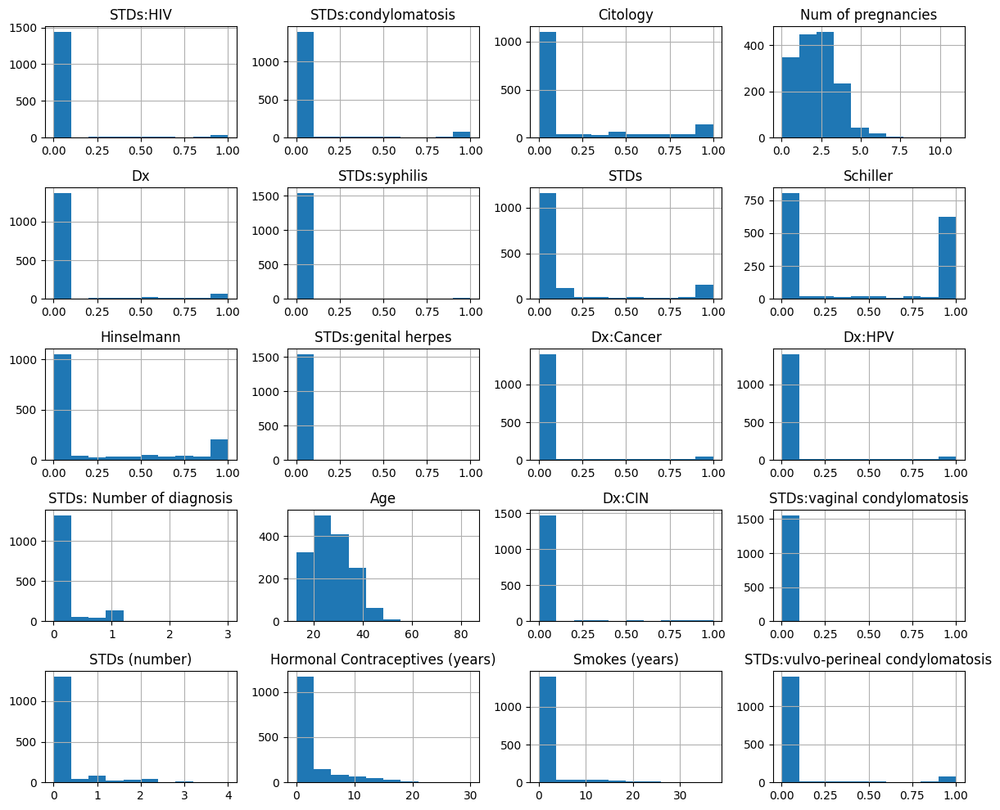

In [29]:


X_selected.hist(figsize=(12,10))
plt.tight_layout()
plt.show()

Explore Relationships with Scatter Plots

Explore pairwise relationships between numerical variables using scatter plots. This helps in identifying potential correlations or patterns.

Plot scatter plots of each feature against the target variable to visually inspect relationships.

Linear Relationship: Points form a line or a pattern that resembles a straight line.

Non-Linear Relationship: Points form a curve or more complex pattern.

Correlation coefficients range from -1 to 1, where:

1 indicates a perfect positive correlation (as one variable increases, the other increases).

-1 indicates a perfect negative correlation (as one variable increases, the other decreases).

0 indicates no correlation (the variables are independent of each other).

Color Coding:

Red Cells: Indicate a strong positive correlation (close to 1).

 For example, if one feature increases, the other also tends to increase.

Blue Cells: Indicate a strong negative correlation (close to -1).

 For example, if one feature increases, the other tends to decrease.
 
White Cells: Indicate no correlation (close to 0).
Annotated Values:

Each cell will have a number indicating the exact correlation coefficient between the respective pair of features.
Diagonal Line:

The diagonal line from the top-left to the bottom-right of the heatmap will always show a correlation of 1,
 as each feature is perfectly correlated with itself.

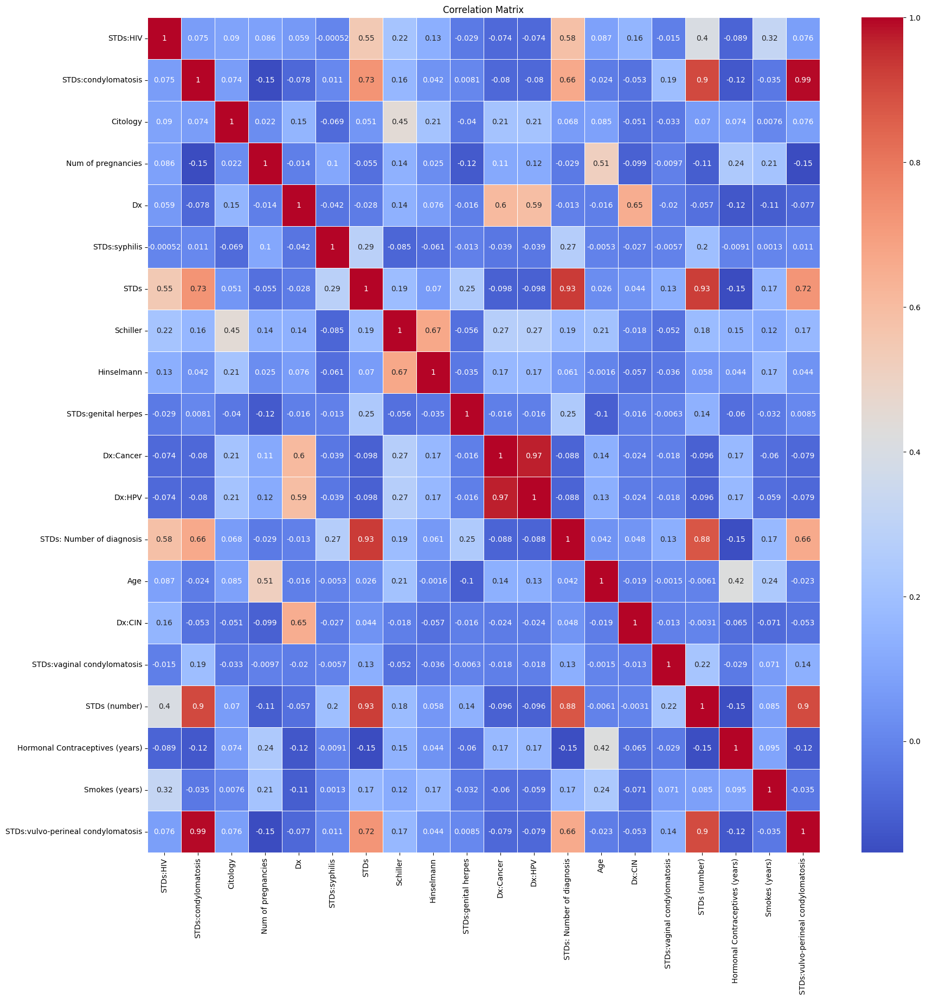

In [30]:
# Calculate correlations
correlation_matrix = X_selected.corr()

# Plot heatmap of correlations
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix')
plt.show()


Check for Non-Linear Relationships

SPlitting Data

In [31]:
X=X_selected

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size=0.3, random_state=42)

DATA BALANCING

In [33]:
adasyn = SMOTETomek(random_state=42)
X_train, y_train = adasyn.fit_resample(X_train, y_train)

adasyn = SMOTETomek(random_state=42)
X_train2, y_train2 = adasyn.fit_resample(X_train2, y_train2)


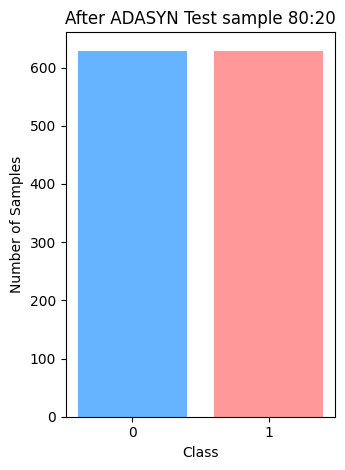

([<matplotlib.axis.XTick at 0x24a2233db50>,
 [Text(0, 0, '0'), Text(1, 0, '1')])

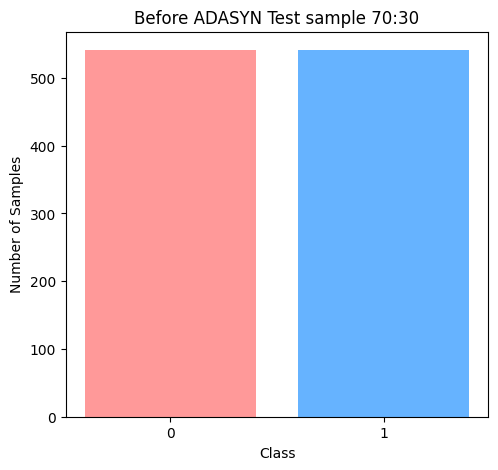

In [34]:
counter_after = Counter(y_train)
plt.subplot(1, 2, 2)
plt.bar(counter_after.keys(), counter_after.values(), color=['#ff9999','#66b3ff'])
plt.title('After ADASYN Test sample 80:20')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks([0, 1])

plt.tight_layout()
plt.show()

counter_before = Counter(y_train2)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.bar(counter_before.keys(), counter_before.values(), color=['#ff9999','#66b3ff'])
plt.title('Before ADASYN Test sample 70:30')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks([0, 1])

Algorithm Testings

You're correct that the direct conversion of GradientBoostingClassifier to TensorFlow format is not straightforward. TensorFlow does not directly support conversion from scikit-learn models like GradientBoostingClassifier. Instead, you should train a TensorFlow model that aims to achieve similar performance to your GradientBoostingClassifier.

Different Samples

In [35]:
# import pandas as pd
# import numpy as np
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import accuracy_score, precision_score, recall_score
# from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.svm import SVC
# from sklearn.neural_network import MLPClassifier
# from sklearn.ensemble import AdaBoostClassifier
# from xgboost import XGBClassifier
# from catboost import CatBoostClassifier
# import tensorflow as tf

# Define models
models = {
    'KNeighbors': KNeighborsClassifier(),
    'DecisionTree': DecisionTreeClassifier(),
    'RandomForest': RandomForestClassifier(),
    'SVM': SVC(probability=True),
    'GradientBoosting': GradientBoostingClassifier(),
    'MLP': MLPClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'CatBoost': CatBoostClassifier(verbose=0),
    'XGBoost': XGBClassifier(),
    'ExtraTrees': ExtraTreesClassifier()
}

# Define train-test splits
splits = [(0.7, 0.3), (0.8, 0.2)]

# Results list
results = []

def evaluate_keras_model(X_train, y_train, X_test, y_test):# Define this function to create and compile your TensorFlow model
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    y_pred_proba = model.predict(X_test)
    y_pred = (y_pred_proba > 0.5).astype(int).flatten()
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    return accuracy, precision, recall

for model_name, model in models.items():
    for train_ratio, test_ratio in splits:
        X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=train_ratio, test_size=test_ratio, random_state=42)

        if model_name == 'TensorFlow':
            accuracy, precision, recall = evaluate_keras_model(X_train, y_train, X_test, y_test)
        else:
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            accuracy = accuracy_score(y_test, y_pred)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)

        results.append({
            'Model': model_name,
            'actual_model': model,
            'Train Ratio': train_ratio,
            'Test Ratio': test_ratio,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall
        })

# Convert results to DataFrame
results_df = pd.DataFrame(results)
print(results_df)


d:\Projects\Python\ML\cervical\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
d:\Projects\Python\ML\cervical\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
d:\Projects\Python\ML\cervical\venv\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
d:\Projects\Python\ML\cervical\venv\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn

               Model                                       actual_model  \
0         KNeighbors                             KNeighborsClassifier()   
1         KNeighbors                             KNeighborsClassifier()   
2       DecisionTree                           DecisionTreeClassifier()   
3       DecisionTree                           DecisionTreeClassifier()   
4       RandomForest  (DecisionTreeClassifier(max_features='sqrt', r...   
5       RandomForest  (DecisionTreeClassifier(max_features='sqrt', r...   
6                SVM                              SVC(probability=True)   
7                SVM                              SVC(probability=True)   
8   GradientBoosting  ([DecisionTreeRegressor(criterion='friedman_ms...   
9   GradientBoosting  ([DecisionTreeRegressor(criterion='friedman_ms...   
10               MLP                                    MLPClassifier()   
11               MLP                                    MLPClassifier()   
12          AdaBoost  (De

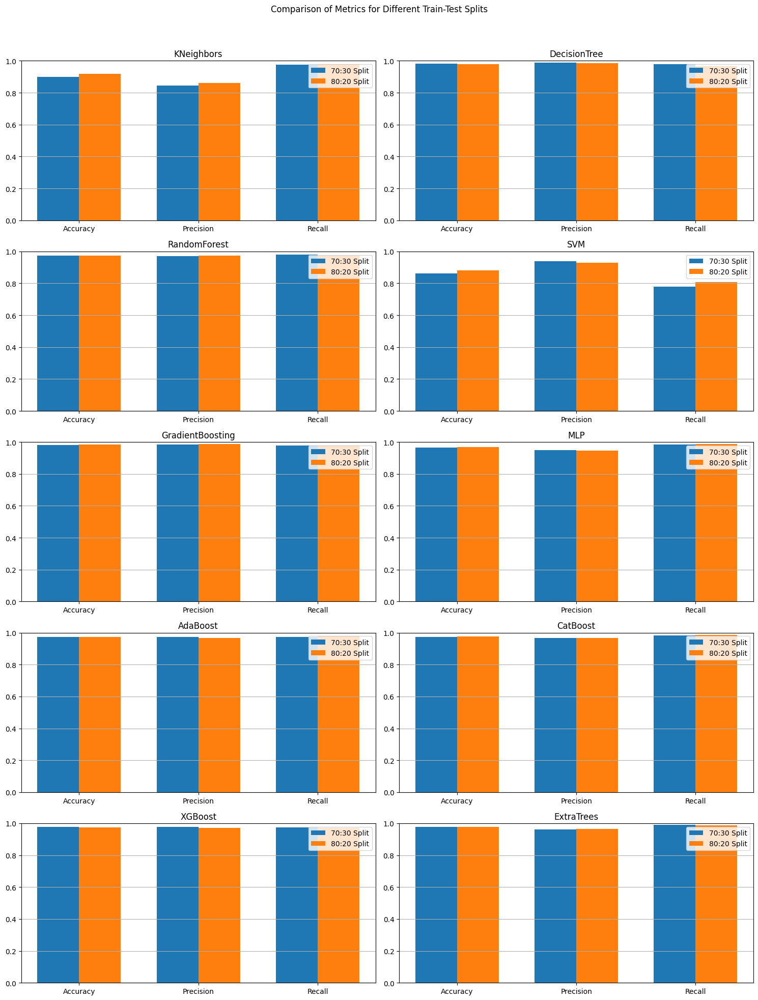

In [36]:
# Extracting unique models from results_df
unique_models = results_df['Model'].unique()

# Metrics to be plotted
metrics = ['Accuracy', 'Precision', 'Recall']

# Data structure for storing the metrics
results_data = {model: {'70:30': {}, '80:20': {}} for model in unique_models}

# Filling the data structure with the metric values from results_df
for index, row in results_df.iterrows():
    model = row['Model']
    train_test_split = f"{int(row['Train Ratio']*100)}:{int(row['Test Ratio']*100)}"
    results_data[model][train_test_split]['Accuracy'] = row['Accuracy']
    results_data[model][train_test_split]['Precision'] = row['Precision']
    results_data[model][train_test_split]['Recall'] = row['Recall']

# Plotting the comparison graphs
fig, axes = plt.subplots(5, 2, figsize=(15, 20))  # Adjusted the number of subplots
fig.suptitle('Comparison of Metrics for Different Train-Test Splits')

# Flatten the axes for easier iteration if there's an odd number of subplots
axes = axes.flatten()
for idx, model in enumerate(unique_models):
    ax = axes[idx]
    width = 0.35  # Width of the bars
    x = range(len(metrics))  # X-axis positions

    # Extracting the values for each split
    values_7030 = [results_data[model]['70:30'][metric] for metric in metrics]
    values_8020 = [results_data[model]['80:20'][metric] for metric in metrics]

    # Plotting bars for each metric and train-test split
    ax.bar([p - width/2 for p in x], values_7030, width=width, label='70:30 Split')
    ax.bar([p + width/2 for p in x], values_8020, width=width, label='80:20 Split')
    
    ax.set_title(model)
    ax.set_xticks(x)
    ax.set_xticklabels(metrics)
    ax.set_ylim(0, 1)
    ax.legend()
    ax.grid(axis='y')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [37]:
metrics = {}
filtere_results_df=results_df[results_df['Train Ratio'] > 0.7]
for index, row in filtere_results_df.iterrows():
    model = row['Model']
    accuracy=row['Accuracy']
    precision=row['Precision']
    recall=row['Recall']
    metrics[model]={'accuracy': accuracy, 'precision': precision, 'recall': recall,"model":row["actual_model"],"model_name":model}
def create_tf_model():
    model = tf.keras.Sequential([
       tf.keras.layers.Dense(64, activation='relu', input_shape=(X.shape[1],)),
       tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
     ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

tf_model=create_tf_model()
tf_model.fit(X_train2, y_train2, epochs=10, verbose=0)
tf_preds = (tf_model.predict(X_test2) > 0.5).astype(int)
tf_acc = accuracy_score(y_test2, tf_preds)
tf_prec = precision_score(y_test2, tf_preds)
tf_recall = recall_score(y_test2, tf_preds)

metrics["TensorFlow"]={'accuracy': tf_acc, 'precision': tf_prec, 'recall': tf_recall,"model":tf_model,"model_name":"TensorFlow"}



d:\Projects\Python\ML\cervical\venv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [38]:
algorithms = list(metrics.keys())
accuracies = [metrics[algo]['accuracy'] for algo in algorithms]
precisions = [metrics[algo]['precision'] for algo in algorithms]
recalls = [metrics[algo]['recall'] for algo in algorithms]

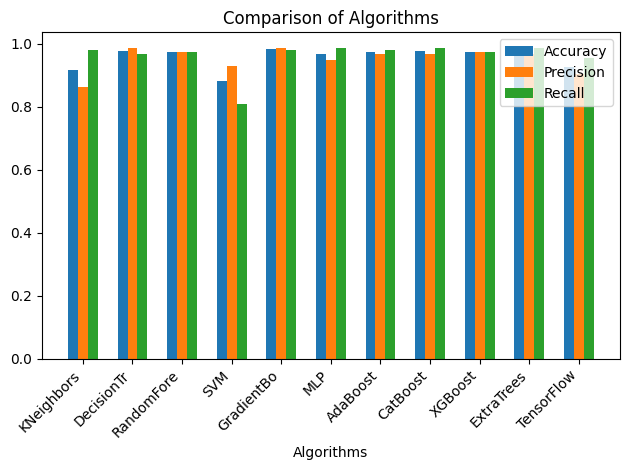

In [39]:


x = np.arange(len(algorithms))  # the label locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots()
bars1 = ax.bar(x - width, accuracies, width, label='Accuracy')
bars2 = ax.bar(x, precisions, width, label='Precision')
bars3 = ax.bar(x + width, recalls, width, label='Recall')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Algorithms')
ax.set_title('Comparison of Algorithms')
ax.set_xticks(x)
ax.set_xticklabels([algo[:10] for algo in algorithms], rotation=45, ha='right')
ax.legend()

fig.tight_layout()

plt.show()

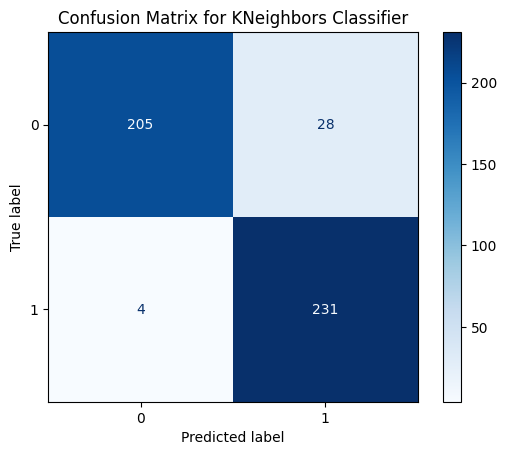

Confusion Matrix:
[[205  28]
 [  4 231]]


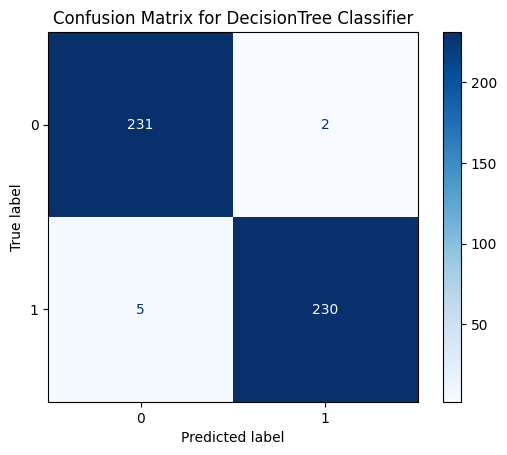

Confusion Matrix:
[[231   2]
 [  5 230]]


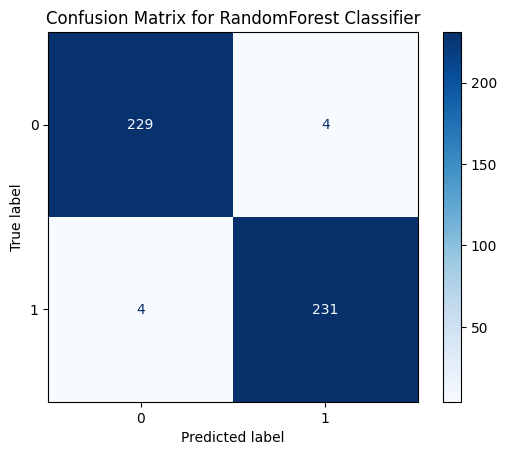

Confusion Matrix:
[[229   4]
 [  4 231]]


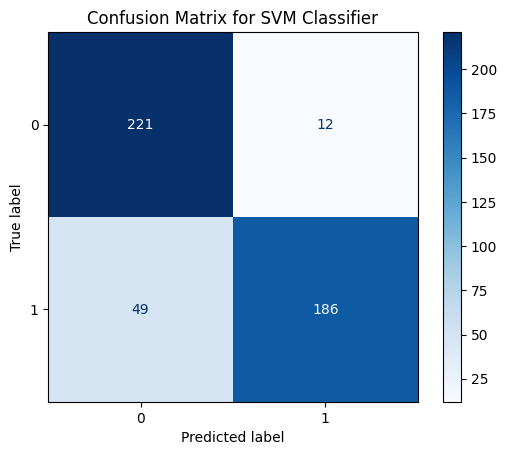

Confusion Matrix:
[[221  12]
 [ 49 186]]


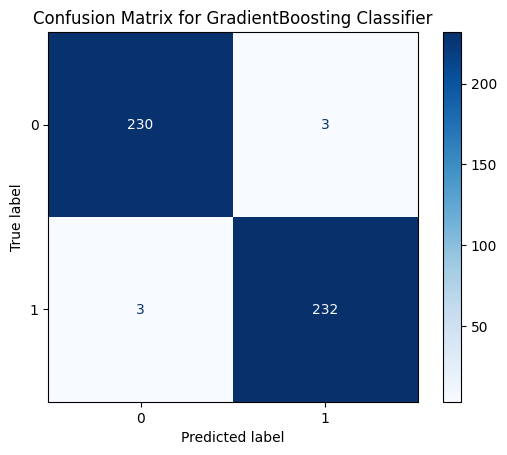

Confusion Matrix:
[[230   3]
 [  3 232]]


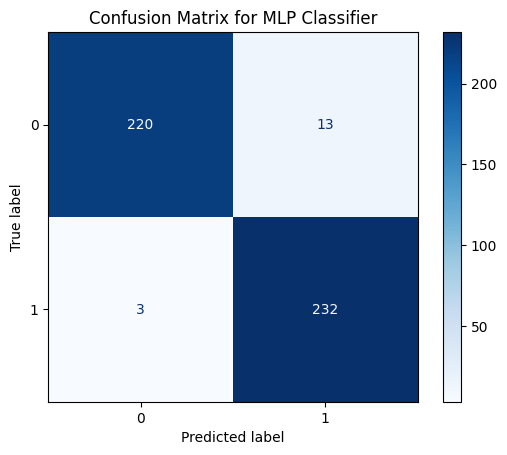

Confusion Matrix:
[[220  13]
 [  3 232]]


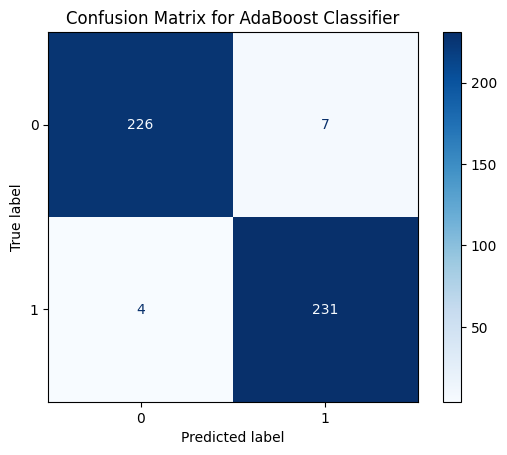

Confusion Matrix:
[[226   7]
 [  4 231]]


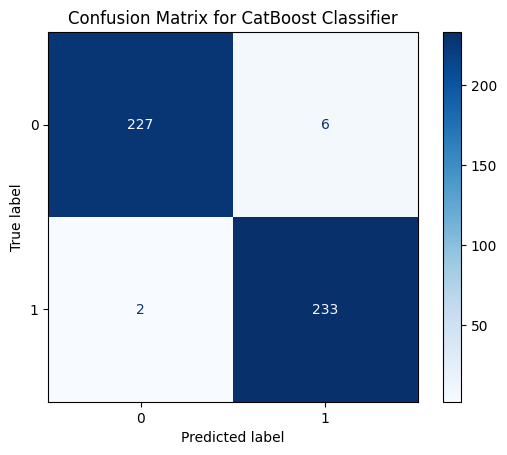

Confusion Matrix:
[[227   6]
 [  2 233]]


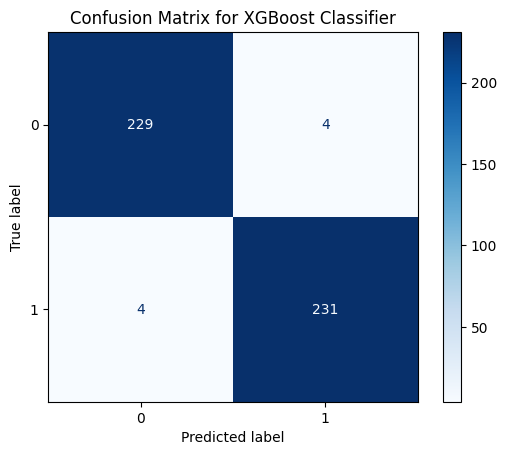

Confusion Matrix:
[[229   4]
 [  4 231]]


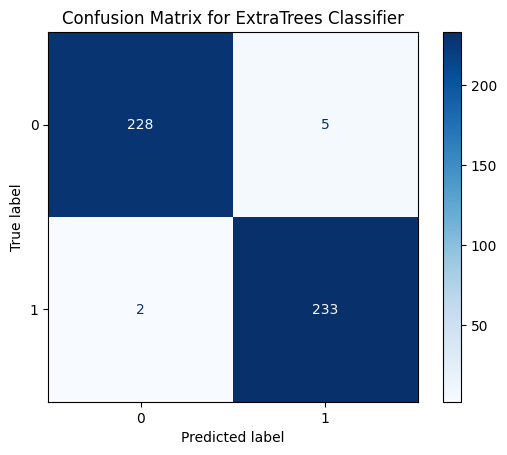

Confusion Matrix:
[[228   5]
 [  2 233]]
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


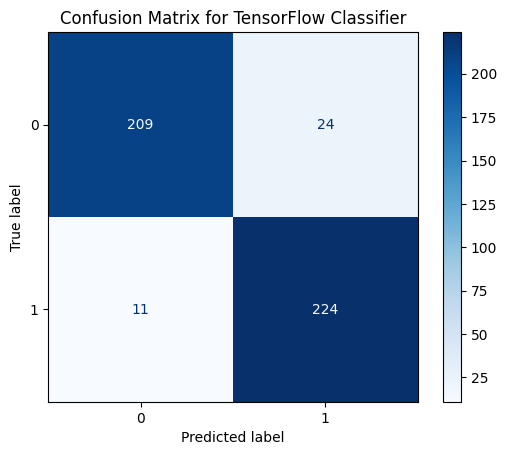

Confusion Matrix:
[[209  24]
 [ 11 224]]


In [40]:

models = [{"model":metrics[algo]['model'],"model_name":metrics[algo]['model_name']} for algo in algorithms]

for algo in models:
    model=algo['model']
    model_name=algo['model_name']
    y_pred_probs = model.predict(X_test2)
    y_pred = (y_pred_probs > 0.5).astype(int)  # Convert probabilities to binary class labels
    # Calculate the confusion matrix
    cm = confusion_matrix(y_test2, y_pred)

    # Display the confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix for {model_name} Classifier')
    plt.show()

    # Optionally print the confusion matrix
    print("Confusion Matrix:")
    print(cm)

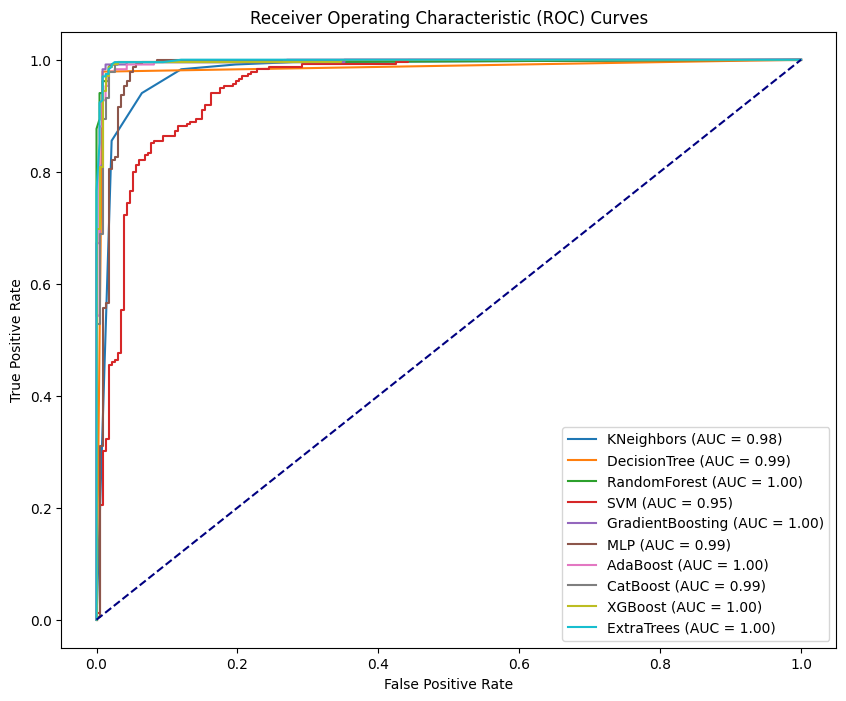

In [41]:
plt.figure(figsize=(10, 8))
models = [{"model":metrics[algo]['model'],"model_name":metrics[algo]['model_name']} for algo in algorithms]

for algo in models:
    model=algo['model']
    model_name=algo['model_name']
    if model_name!="TensorFlow":
        if hasattr(model, "predict_proba"):
            y_proba = model.predict_proba(X_test2)[:, 1]  # Use the probability of the positive class
        else:  # For models that don't have predict_proba, use decision function
            y_proba = model.decision_function(X_test2)
        # Compute ROC curve and ROC area
        fpr, tpr, _ = roc_curve(y_test2, y_proba)
        roc_auc = auc(fpr, tpr)
        
        # Plot ROC curve
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Axis labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="lower right")

# Show plot
plt.show()

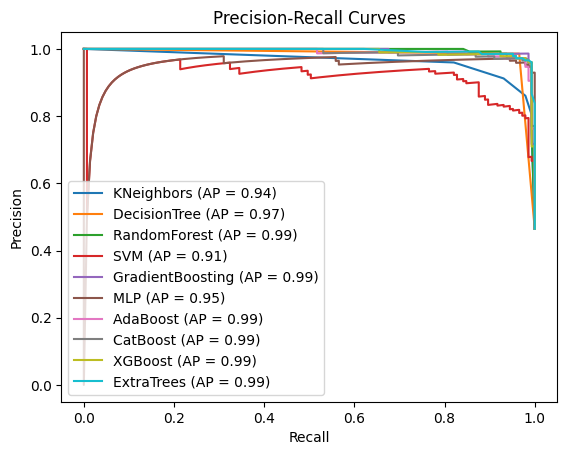

In [42]:
models = [{"model":metrics[algo]['model'],"model_name":metrics[algo]['model_name']} for algo in algorithms]

for algo in models:
    model=algo['model']
    model_name=algo['model_name']
    if model_name!="TensorFlow":
        if hasattr(model, "predict_proba"):
            y_proba = model.predict_proba(X_test)[:, 1]  # Use the probability of the positive class
        else:  # For models that don't have predict_proba, use decision function
            y_proba = model.decision_function(X_test)
        
        # Compute Precision-Recall curve and average precision
        precision, recall, _ = precision_recall_curve(y_test, y_proba)
        avg_precision = average_precision_score(y_test, y_proba)
        
        # Plot Precision-Recall curve
        plt.plot(recall, precision, label=f'{model_name} (AP = {avg_precision:.2f})')

# Axis labels and title
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc="lower left")

# Show plot
plt.show()

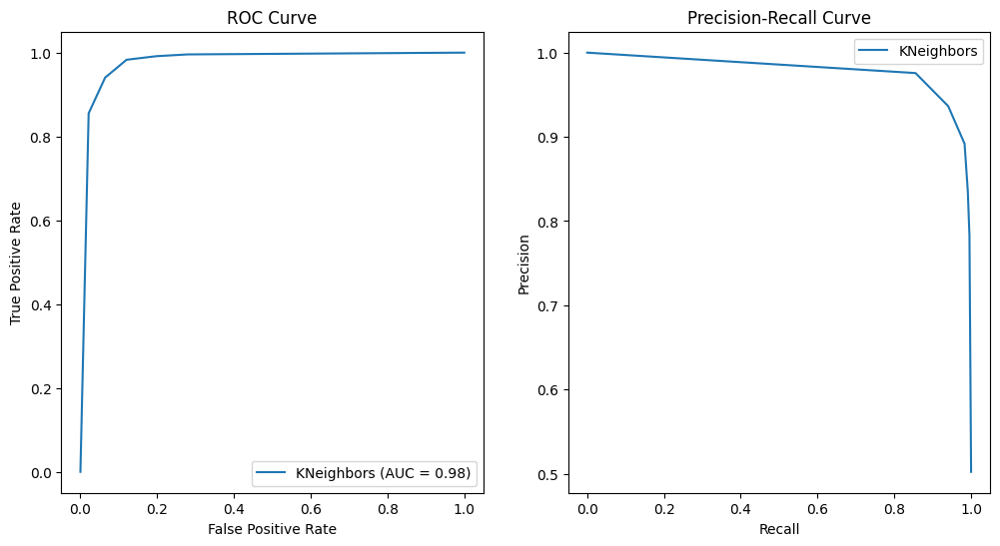

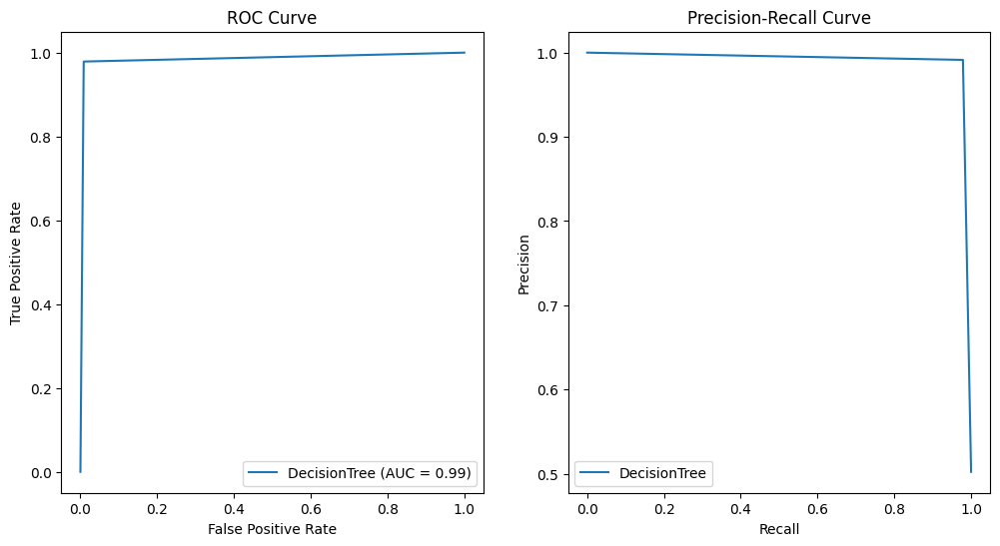

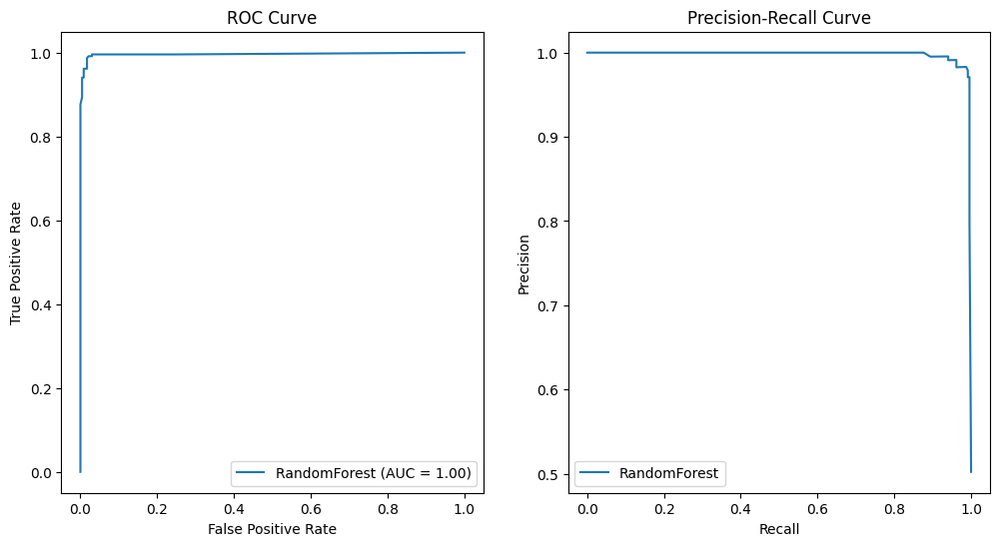

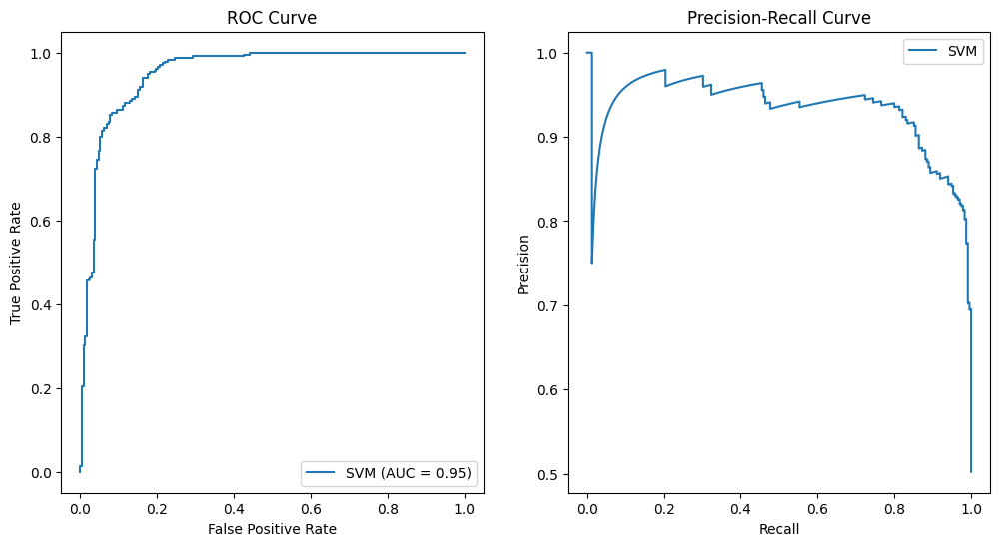

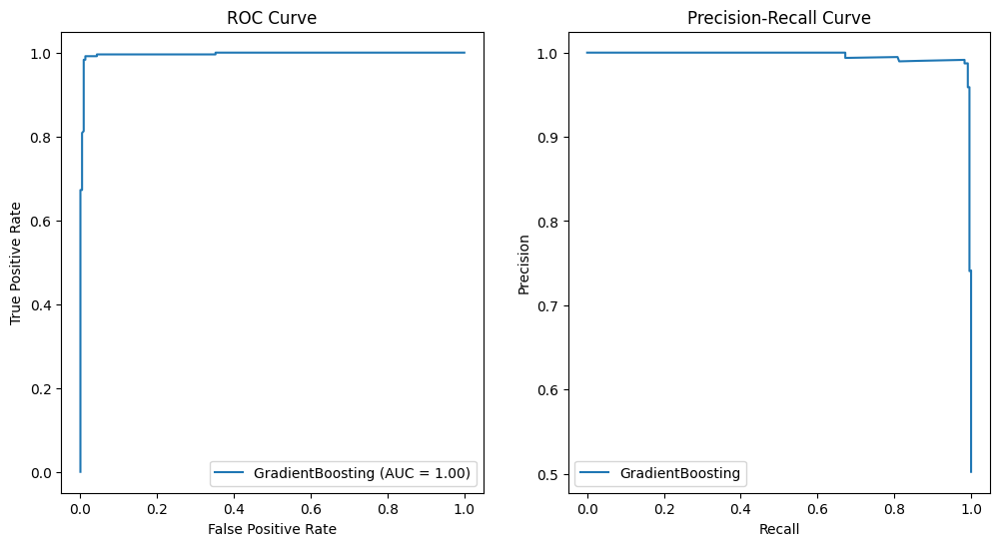

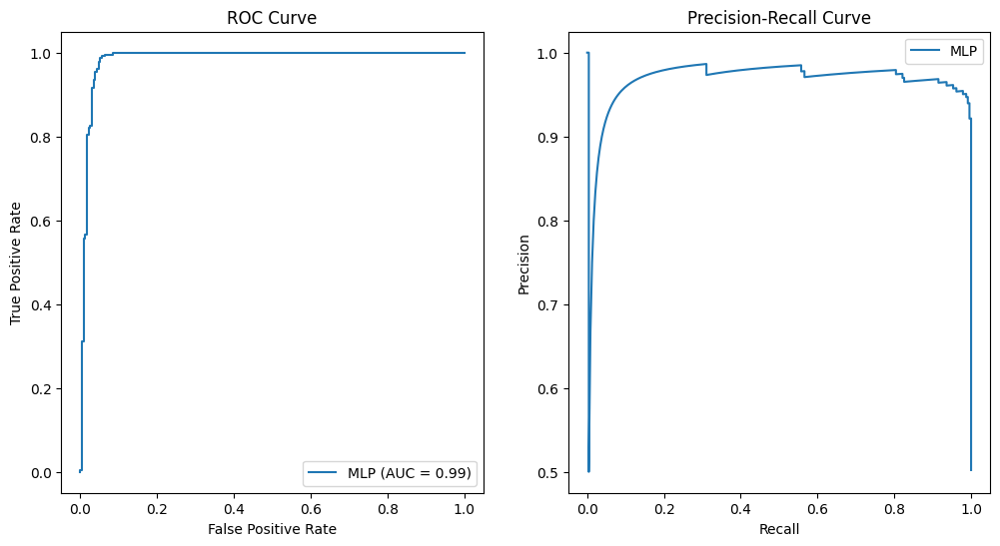

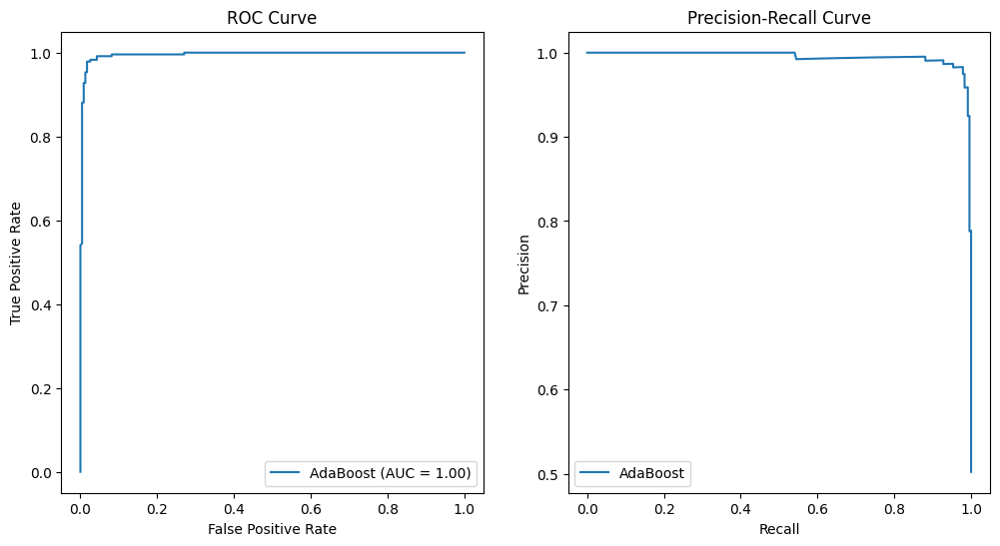

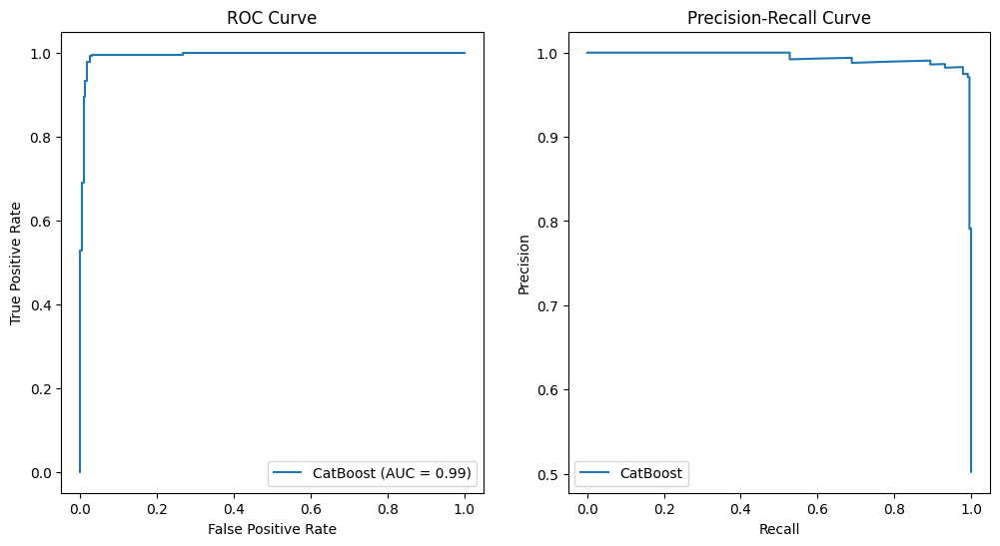

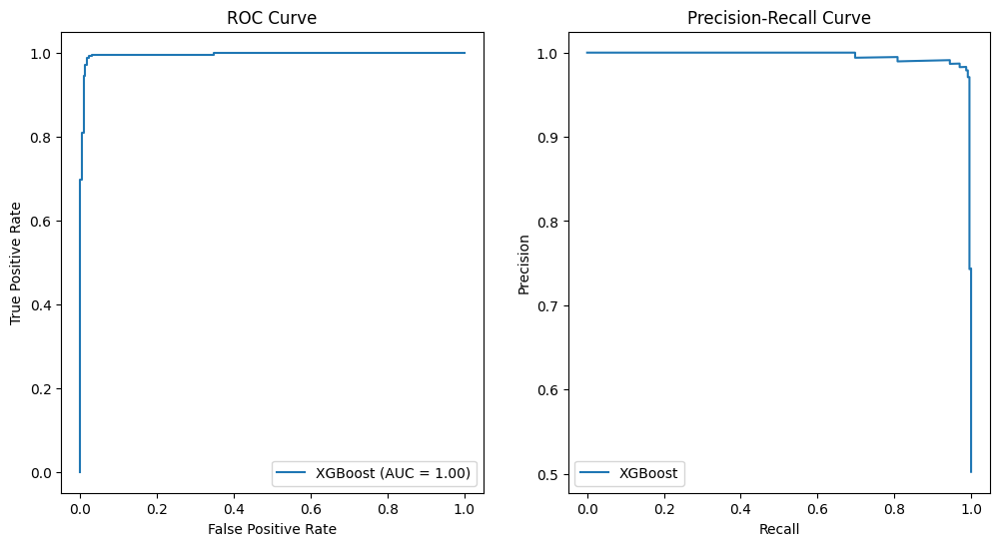

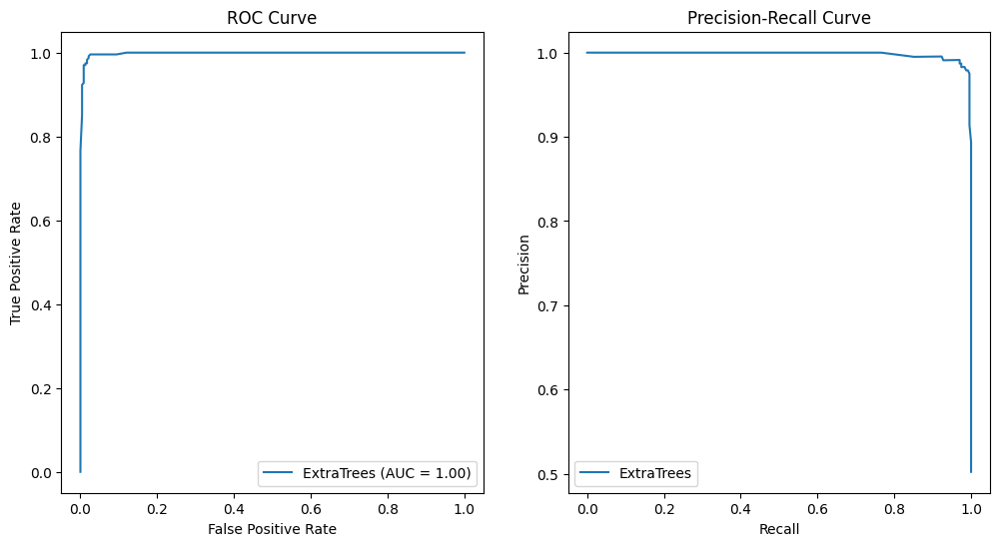

In [43]:

for name, clf in metrics.items():
    model=clf["model"]
    if clf["model_name"]!="TensorFlow":
        y_probs = model.predict_proba(X_test2)[:, 1]
        fpr, tpr, _ = roc_curve(y_test2, y_probs)
        precision, recall, _ = precision_recall_curve(y_test2, y_probs)
        
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc_score(y_test2, y_probs):.2f})')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(recall, precision, label=f'{name}')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title('Precision-Recall Curve')
        plt.legend()

        plt.show()


In [44]:
    
base_models = [
    (f"{metrics[algo]['model_name']}", metrics[algo]['model']) for algo in algorithms if metrics[algo]['model_name']!="TensorFlow"
]
final_estimator = LogisticRegression()
stacking_model = StackingClassifier(estimators=base_models, final_estimator=final_estimator, cv=5)
stacking_model.fit(X_train2, y_train2)

# Compute SHAP values
explainer = shap.KernelExplainer(stacking_model.predict_proba, X_train2)
shap_values = explainer.shap_values(X_test2)

# Plot SHAP values
shap.summary_plot(shap_values, X_test2, plot_type="bee")  # Bee swarm plot
shap.summary_plot(shap_values, X_test2, plot_type="bar")  

d:\Projects\Python\ML\cervical\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
d:\Projects\Python\ML\cervical\venv\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
d:\Projects\Python\ML\cervical\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
d:\Projects\Python\ML\cervical\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
d:\Projects\P

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


ValueError: Found input variables with inconsistent numbers of samples: [1092, 251]

<generator object DataFrame.iterrows at 0x0000018B706E3740>


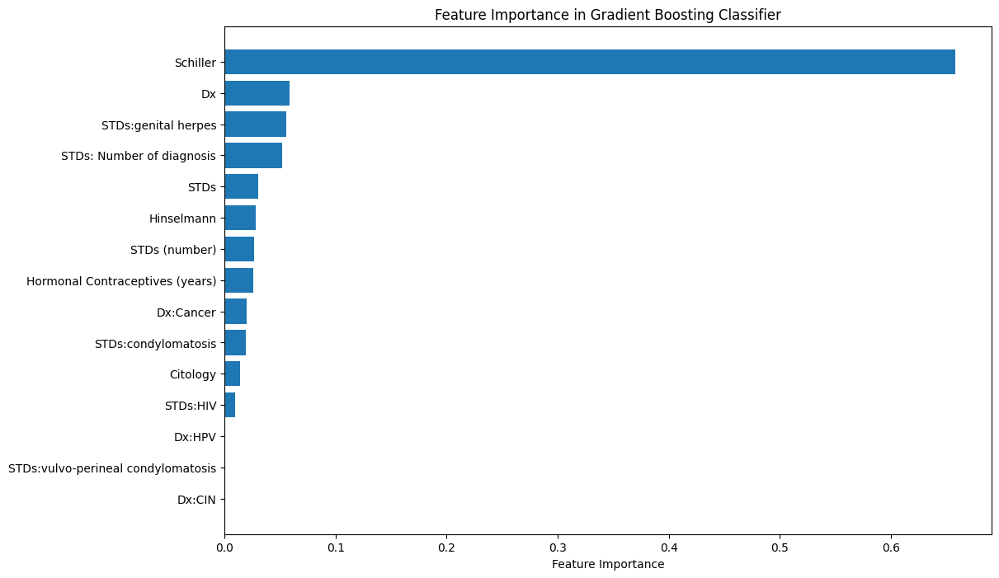

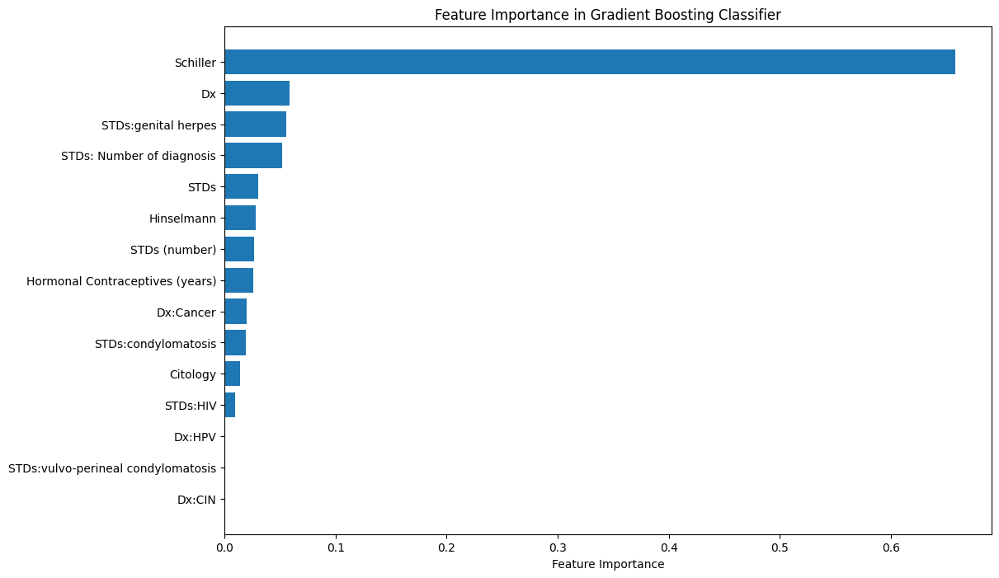

In [39]:
filtere_results_df=results_df[results_df['Model'] =="XGBoost"]
print(filtere_results_df.iterrows())
for index, row in filtere_results_df.iterrows():
    model=row["actual_model"]
    feature_importance = model.feature_importances_
    sorted_idx = np.argsort(feature_importance)
    plt.figure(figsize=(12, 8))
    plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
    plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
    plt.xlabel("Feature Importance")
    plt.title("Feature Importance in Gradient Boosting Classifier")
    plt.show()

PCA